<a href="https://colab.research.google.com/github/Frankie32244/object_detection/blob/main/SIFT4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/adumrewal/SIFTImageSimilarity

In [ ]:
cd SIFTImageSimilarity/

In [ ]:
!pip install -r requirements.txt

In [ ]:
rm -f ./data/descriptors/* ./data/images/* ./data/keypoints/*

In [ ]:
import cv2
import pickle
import matplotlib.pyplot as plt

# 利用cv2.resize对图像进行缩放

def imageResizeTrain(image):
    maxD = 1024
    height,width = image.shape
    aspectRatio = width/height
    if aspectRatio < 1:
        newSize = (int(maxD*aspectRatio),maxD)
    else:
        newSize = (maxD,int(maxD/aspectRatio))
    image = cv2.resize(image,newSize)
    return image

def imageResizeTest(image):
    maxD = 1024
    height,width,channel = image.shape
    aspectRatio = width/height
    if aspectRatio < 1:
        newSize = (int(maxD*aspectRatio),maxD)
    else:
        newSize = (maxD,int(maxD/aspectRatio))
    image = cv2.resize(image,newSize)
    return image

# 调用cv2.sift() 计算出keypoints 和 descriptors
sift = cv2.SIFT_create()
def computeSIFT(image):
    return sift.detectAndCompute(image, None)

In [ ]:
# 数据集
imageList = []

for i in range(1, 89):
    filename = f"{i:03d}.jpg"
    imageList.append(filename)

print(imageList)

image_test_List = []

for i in range(1, 51):
    filename = f"{i:03d}.jpg"
    image_test_List.append(filename)

print(image_test_List)

['001.jpg', '002.jpg', '003.jpg', '004.jpg', '005.jpg', '006.jpg', '007.jpg', '008.jpg', '009.jpg', '010.jpg', '011.jpg', '012.jpg', '013.jpg', '014.jpg', '015.jpg', '016.jpg', '017.jpg', '018.jpg', '019.jpg', '020.jpg', '021.jpg', '022.jpg', '023.jpg', '024.jpg', '025.jpg', '026.jpg', '027.jpg', '028.jpg', '029.jpg', '030.jpg', '031.jpg', '032.jpg', '033.jpg', '034.jpg', '035.jpg', '036.jpg', '037.jpg', '038.jpg', '039.jpg', '040.jpg', '041.jpg', '042.jpg', '043.jpg', '044.jpg', '045.jpg', '046.jpg', '047.jpg', '048.jpg', '049.jpg', '050.jpg', '051.jpg', '052.jpg', '053.jpg', '054.jpg', '055.jpg', '056.jpg', '057.jpg', '058.jpg', '059.jpg', '060.jpg', '061.jpg', '062.jpg', '063.jpg', '064.jpg', '065.jpg', '066.jpg', '067.jpg', '068.jpg', '069.jpg', '070.jpg', '071.jpg', '072.jpg', '073.jpg', '074.jpg', '075.jpg', '076.jpg', '077.jpg', '078.jpg', '079.jpg', '080.jpg', '081.jpg', '082.jpg', '083.jpg', '084.jpg', '085.jpg', '086.jpg', '087.jpg', '088.jpg']
['001.jpg', '002.jpg', '003.jpg

In [ ]:
# 数据集操作
imagesPath = []
for imageName in imageList:
    imagePath = "data/images/" + str(imageName)
    imagesPath.append(imageResizeTrain(cv2.imread(imagePath,0))) # flag 0 means grayscale


keypoints = []
descriptors = []
for i,image in enumerate(imagesPath):
    print("Starting for image: " + imageList[i])
    keypointTemp, descriptorTemp = computeSIFT(image)
    keypoints.append(keypointTemp)
    descriptors.append(descriptorTemp)
    print("  Ending for image: " + imageList[i])


print("-------------------------------------------")
# 测试集操作
images_test_Path = []
for imageName in image_test_List:
    imageTestPath = "data/test/" + str(imageName)
    images_test_Path.append(imageResizeTrain(cv2.imread(imageTestPath,0))) # flag 0 means grayscale


test_keypoints = []
test_descriptors = []
for i,image in enumerate(images_test_Path):
    print("Starting for image: " + image_test_List[i])
    keypointTemp, descriptorTemp = computeSIFT(image)
    test_keypoints.append(keypointTemp)
    test_descriptors.append(descriptorTemp)
    print("  Ending for image: " + image_test_List[i])

Starting for image: 001.jpg
  Ending for image: 001.jpg
Starting for image: 002.jpg
  Ending for image: 002.jpg
Starting for image: 003.jpg
  Ending for image: 003.jpg
Starting for image: 004.jpg
  Ending for image: 004.jpg
Starting for image: 005.jpg
  Ending for image: 005.jpg
Starting for image: 006.jpg
  Ending for image: 006.jpg
Starting for image: 007.jpg
  Ending for image: 007.jpg
Starting for image: 008.jpg
  Ending for image: 008.jpg
Starting for image: 009.jpg
  Ending for image: 009.jpg
Starting for image: 010.jpg
  Ending for image: 010.jpg
Starting for image: 011.jpg
  Ending for image: 011.jpg
Starting for image: 012.jpg
  Ending for image: 012.jpg
Starting for image: 013.jpg
  Ending for image: 013.jpg
Starting for image: 014.jpg
  Ending for image: 014.jpg
Starting for image: 015.jpg
  Ending for image: 015.jpg
Starting for image: 016.jpg
  Ending for image: 016.jpg
Starting for image: 017.jpg
  Ending for image: 017.jpg
Starting for image: 018.jpg
  Ending for image: 

In [ ]:
bf = cv2.BFMatcher()
def calculateMatches(des1,des2):
    matches = bf.knnMatch(des1,des2,k=2)
    topResults1 = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            topResults1.append([m])

    matches = bf.knnMatch(des2,des1,k=2)
    topResults2 = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            topResults2.append([m])

    topResults = []
    for match1 in topResults1:
        match1QueryIndex = match1[0].queryIdx
        match1TrainIndex = match1[0].trainIdx

        for match2 in topResults2:
            match2QueryIndex = match2[0].queryIdx
            match2TrainIndex = match2[0].trainIdx

            if (match1QueryIndex == match2TrainIndex) and (match1TrainIndex == match2QueryIndex):
                topResults.append(match1)
    return topResults


def calculateScore(matches,keypoint1,keypoint2):
    return 100 * (matches/min(keypoint1,keypoint2))

def getPlotFor(i,j,keypoint1,keypoint2,matches):
    image1 = imageResizeTest(cv2.imread("data/images/" + imageList[i]))
    image2 = imageResizeTest(cv2.imread("data/test/" + image_test_List[j]))
    return getPlot(image1,image2,keypoint1,keypoint2,matches)


def getPlot(image1,image2,keypoint1,keypoint2,matches):
    image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
    matchPlot = cv2.drawMatchesKnn(
        image1,
        keypoint1,
        image2,
        keypoint2,
        matches,
        None,
        [255,255,255],
        flags=2
    )
    return matchPlot


def getScore(i,j):
    keypoint1 = keypoints[i]
    descriptor1 = descriptors[i]
    keypoint2 = test_keypoints[j]
    descriptor2 = test_descriptors[j]
    matches = calculateMatches(descriptor1, descriptor2)
    score = calculateScore(len(matches),len(keypoint1),len(keypoint2))
    return score




def calculateResultsFor(i,j):
    keypoint1 = keypoints[i]
    descriptor1 = descriptors[i]
    keypoint2 = test_keypoints[j]
    descriptor2 = test_descriptors[j]
    matches = calculateMatches(descriptor1, descriptor2)
    score = calculateScore(len(matches),len(keypoint1),len(keypoint2))
    plot = getPlotFor(i,j,keypoint1,keypoint2,matches)
    print(len(matches),len(keypoint1),len(keypoint2),len(descriptor1),len(descriptor2))
    print(score)
    plt.imshow(plot),plt.show()

In [ ]:
score_array = []
#  i 表示数据集的图片 0 -> 001.jpg  j 表示测试集的图片 0 -> 001.jpg
def getMaxScore(j):
    maxScore = 0
    global index
    for i in range(0,88):
        score = getScore(i,j)
        score_array.append(score)
        index  =  i if score > maxScore  else index
        print(score,index)
        maxScore = max(maxScore,score)
    return maxScore

In [ ]:
# 格式化test下jpg文件的名字 为  001.jpg 002.jpg ....
import os

folder_path = "data/test"  # 替换为实际包含文件的文件夹路径

# 获取文件夹下所有文件
file_list = os.listdir(folder_path)

if len(file_list) > 0:
    counter = 1
    for file_name in file_list:
        if file_name.lower().endswith(".jpg"):
            file_extension = os.path.splitext(file_name)[1]
            new_file_name = "{:03d}{}".format(counter, file_extension)
            old_file_path = os.path.join(folder_path, file_name)
            new_file_path = os.path.join(folder_path, new_file_name)
            os.rename(old_file_path, new_file_path)
            counter += 1
    print("File renaming completed.")
else:
    print("No files found in the folder.")


File renaming completed.


0.009592326139088728 0
0.00907605736068252 0
0.01694053870913095 2
0.11997600479904018 3
17.628010524185385 4
0.035423308537017355 4
0.0 4
0.08947211452430659 4
0.03275466754012447 4
0.01699668564629897 4
0.056338028169014086 4
0.0 4
0.07501875468867217 4
0.05305039787798408 4
0.09490667510281556 4
0.06157635467980296 4
0.04061738424045491 4
0.03399337129259794 4
0.02284148012791229 4
0.0 4
0.04253509145044662 4
0.0 4
0.032061558191728116 4
0.05884660651235779 4
0.02452783909737552 4
0.0549551199853453 4
0.011723329425556858 4
0.020927069163963585 4
0.009062896501721951 4
0.09049773755656108 4
0.07230657989877079 4
0.008498342823149485 4
0.02983293556085919 4
0.0 4
0.017605633802816902 4
0.0 4
0.31982942430703626 4
0.0 4
0.05152868430092751 4
0.0635862653666808 4
0.06517842594101353 4
0.026888948642108095 4
0.0 4
0.12886597938144329 4
0.030515715593530668 4
0.0 4
0.058224163027656484 4
0.03131850923896023 4
0.08762322015334063 4
0.0 4
0.013885031935573453 4
0.026305405760883863 4
0.020

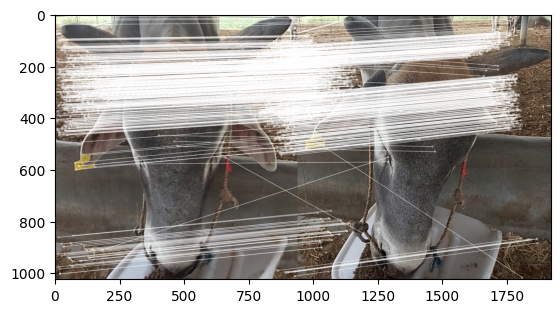

0.020395676116663267 0
0.020395676116663267 0
0.020395676116663267 0
0.0 0
0.020395676116663267 0
0.061187028349989805 5
0.040791352233326535 5
0.029824038174768867 5
0.040791352233326535 5
0.020395676116663267 5
0.0 5
0.0 5
0.0 5
0.020395676116663267 5
0.0 5
0.06157635467980296 15
0.04061738424045491 15
0.061187028349989805 15
0.020395676116663267 15
0.0 15
0.0 15
0.020395676116663267 15
1.5068932350112216 22
0.040791352233326535 22
0.04905567819475104 22
0.061187028349989805 22
0.040791352233326535 22
0.020395676116663267 22
0.040791352233326535 22
0.02262443438914027 22
0.07230657989877079 22
0.040791352233326535 22
0.02983293556085919 22
0.24752475247524752 22
0.0 22
0.0 22
0.15991471215351813 22
0.554016620498615 22
0.040791352233326535 22
0.0423908435777872 22
0.040791352233326535 22
0.0 22
0.0 22
0.0 22
0.061031431187061336 22
0.0 22
0.0 22
0.0 22
0.02190580503833516 22
0.08158270446665307 22
0.061187028349989805 22
0.040791352233326535 22
0.0 22
0.058105752469494475 22
0.061187

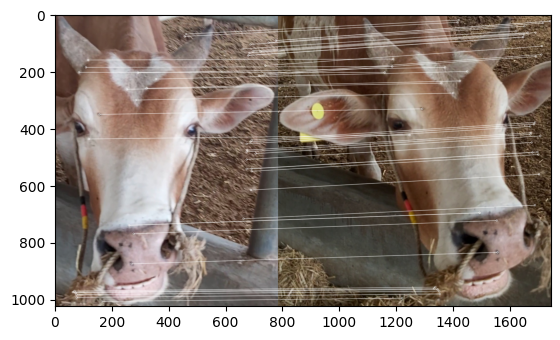

0.03177629488401652 0
0.0 0
0.0 0
0.11997600479904018 3
0.03177629488401652 3
0.06355258976803305 3
0.03177629488401652 3
0.06355258976803305 3
0.0 3
0.06355258976803305 3
0.03177629488401652 3
0.06642311524410495 3
0.07501875468867217 3
0.03177629488401652 3
0.03177629488401652 3
0.03177629488401652 3
0.08123476848090982 3
0.1271051795360661 17
0.0 17
0.0 17
0.0 17
0.0 17
0.032061558191728116 17
0.03177629488401652 17
0.06355258976803305 17
0.0 17
0.03177629488401652 17
0.1271051795360661 17
0.0 17
0.0 17
0.0 17
0.0 17
0.09532888465204957 17
0.0 17
0.03177629488401652 17
0.0 17
0.053304904051172705 17
0.0 17
0.03177629488401652 17
0.09532888465204957 17
0.0 17
0.03177629488401652 17
0.06557377049180328 17
0.12886597938144329 43
0.06355258976803305 43
0.0 43
0.09532888465204957 43
0.06355258976803305 43
0.06355258976803305 43
0.09532888465204957 43
0.03177629488401652 43
0.06355258976803305 43
0.0 43
0.11621150493898895 43
0.22243406418811568 54
0.06355258976803305 54
0.034188034188034

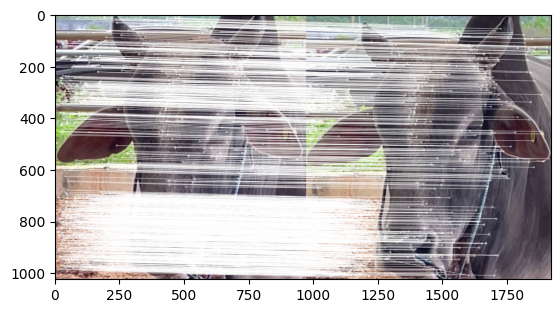

0.08456659619450317 0
0.021141649048625793 0
0.021141649048625793 0
0.0 0
0.042283298097251586 0
0.021141649048625793 0
0.0 0
0.0 0
0.08456659619450317 0
0.021141649048625793 0
0.056338028169014086 0
0.06642311524410495 0
0.037509377344336084 0
0.021141649048625793 0
0.03163555836760519 0
0.0 0
0.04061738424045491 0
0.042283298097251586 0
0.021141649048625793 0
0.0 0
0.0 0
0.021141649048625793 0
0.0 0
0.0 0
0.02452783909737552 0
0.0 0
0.021141649048625793 0
0.042283298097251586 0
0.0 0
0.06787330316742081 0
0.07230657989877079 0
0.0 0
0.02983293556085919 0
0.0 0
0.06342494714587738 0
0.045568466621098196 0
0.0 0
0.0 0
0.021141649048625793 0
0.0211954217888936 0
0.021141649048625793 0
0.05377789728421619 0
0.03278688524590164 0
0.0 0
0.061031431187061336 0
0.0 0
0.0 0
0.021141649048625793 0
0.02190580503833516 0
0.0 0
0.0 0
0.0 0
0.06342494714587738 0
0.0 0
0.38054968287526425 54
0.06342494714587738 54
0.03418803418803419 54
0.07513148009015778 54
0.027344818156959255 54
0.0 54
0.0 54
0

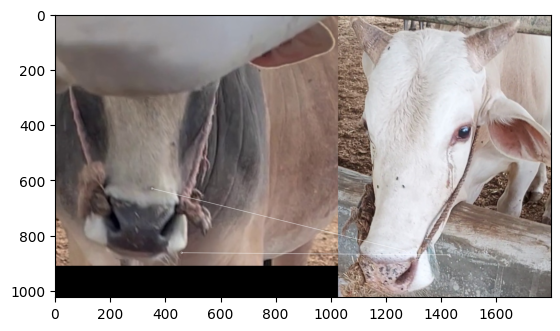

0.0 0
0.08417508417508417 1
0.08417508417508417 1
0.05998800239952009 1
0.08417508417508417 1
0.04208754208754208 1
0.21043771043771042 6
0.16835016835016833 6
0.04208754208754208 6
0.04208754208754208 6
0.08417508417508417 6
0.04208754208754208 6
0.04208754208754208 6
0.04208754208754208 6
0.04208754208754208 6
0.12626262626262627 6
0.12626262626262627 6
0.08417508417508417 6
0.08417508417508417 6
0.0 6
0.08507018290089324 6
0.08417508417508417 6
0.16835016835016833 6
0.04208754208754208 6
0.0 6
0.04208754208754208 6
0.08417508417508417 6
0.04208754208754208 6
0.0 6
0.04208754208754208 6
0.07230657989877079 6
0.04208754208754208 6
0.0 6
0.0 6
0.04208754208754208 6
0.08417508417508417 6
0.0 6
0.0 6
0.04208754208754208 6
0.08417508417508417 6
0.04208754208754208 6
0.0 6
0.08417508417508417 6
0.0 6
0.08417508417508417 6
0.04208754208754208 6
0.08417508417508417 6
0.04208754208754208 6
0.0 6
0.04208754208754208 6
0.0 6
0.16835016835016833 6
0.08417508417508417 6
0.058105752469494475 6
0.0

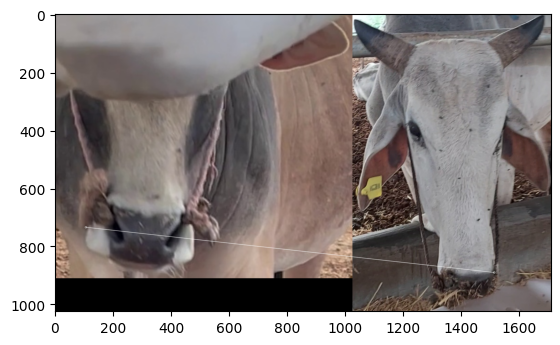

0.08460236886632826 0
0.08460236886632826 0
0.0 0
0.0 0
0.04230118443316413 0
0.0 0
0.04230118443316413 0
0.08460236886632826 0
0.08460236886632826 0
0.12690355329949238 9
0.04230118443316413 9
0.04230118443316413 9
0.0 9
0.0 9
0.04230118443316413 9
0.04230118443316413 9
0.0 9
0.08460236886632826 9
0.04230118443316413 9
0.0 9
0.0 9
0.0 9
0.0 9
0.1692047377326565 23
0.0 23
0.08460236886632826 23
0.08460236886632826 23
0.04230118443316413 23
0.0 23
0.12690355329949238 23
0.14461315979754158 23
0.04230118443316413 23
0.08460236886632826 23
0.0 23
0.08460236886632826 23
0.08460236886632826 23
0.053304904051172705 23
0.0 23
0.0 23
0.12690355329949238 23
0.08460236886632826 23
0.04230118443316413 23
0.0 23
0.12886597938144329 23
0.0 23
0.0 23
0.04230118443316413 23
0.08460236886632826 23
0.0 23
0.12690355329949238 23
0.08460236886632826 23
0.04230118443316413 23
0.04230118443316413 23
0.0 23
0.04230118443316413 23
0.0 23
0.0 23
0.0 23
0.04230118443316413 23
0.12690355329949238 23
0.042301184

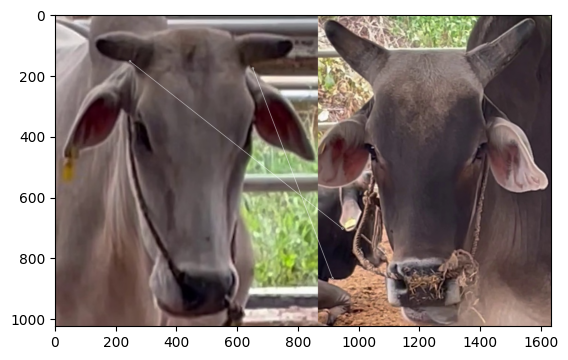

0.0 0
0.033211557622052475 1
0.0 1
0.05998800239952009 3
0.033211557622052475 3
0.033211557622052475 3
0.033211557622052475 3
0.033211557622052475 3
0.033211557622052475 3
0.033211557622052475 3
0.06642311524410495 10
100.0 11
0.11252813203300824 11
0.0 11
0.0 11
0.09963467286615742 11
0.08123476848090982 11
0.09963467286615742 11
0.033211557622052475 11
0.0 11
0.04253509145044662 11
0.06642311524410495 11
0.033211557622052475 11
0.16605778811026237 11
0.0 11
0.09963467286615742 11
0.09963467286615742 11
0.033211557622052475 11
0.033211557622052475 11
0.09963467286615742 11
0.0 11
0.033211557622052475 11
0.033211557622052475 11
0.24752475247524752 11
0.033211557622052475 11
0.0 11
0.10660980810234541 11
0.0 11
0.06642311524410495 11
0.0 11
0.033211557622052475 11
0.0 11
0.0 11
0.0 11
0.033211557622052475 11
0.06642311524410495 11
0.09963467286615742 11
0.0 11
0.06642311524410495 11
0.033211557622052475 11
0.0 11
0.033211557622052475 11
0.033211557622052475 11
0.17431725740848344 11
0.0

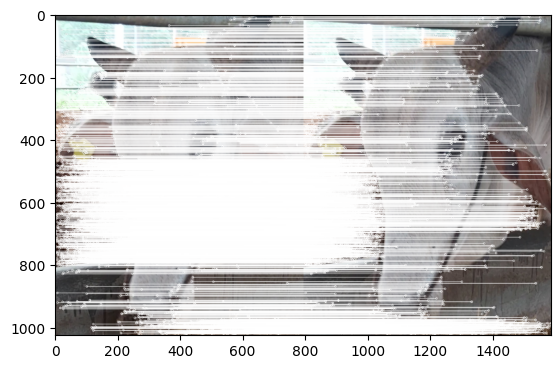

0.0 0
0.08431703204047217 1
0.0 1
0.0 1
0.08431703204047217 1
0.08431703204047217 1
0.0 1
0.0 1
0.0 1
4.0472175379426645 9
0.0 9
0.08431703204047217 9
0.16863406408094433 9
0.0 9
0.0 9
0.16863406408094433 9
0.08431703204047217 9
0.16863406408094433 9
0.25295109612141653 9
0.6493506493506493 9
0.0 9
0.08431703204047217 9
0.0 9
0.0 9
0.0 9
0.08431703204047217 9
0.25295109612141653 9
0.0 9
0.0 9
0.0 9
0.08431703204047217 9
0.0 9
0.0 9
0.49504950495049505 9
0.0 9
0.0 9
0.0 9
0.2770083102493075 9
0.08431703204047217 9
0.0 9
0.0 9
0.08431703204047217 9
0.0 9
0.0 9
0.08431703204047217 9
0.0 9
0.0 9
0.08431703204047217 9
0.0 9
0.08431703204047217 9
0.0 9
0.0 9
0.0 9
0.0 9
0.0 9
0.16863406408094433 9
0.0 9
0.0 9
0.08431703204047217 9
0.0 9
0.25295109612141653 9
0.08431703204047217 9
0.0 9
0.0 9
0.0 9
0.2028397565922921 9
0.0 9
0.0 9
0.0 9
0.0 9
0.0 9
0.0 9
0.22075055187637968 9
0.16863406408094433 9
0.0 9
0.08431703204047217 9
0.25295109612141653 9
0.0 9
0.0 9
0.08431703204047217 9
0.0843170320

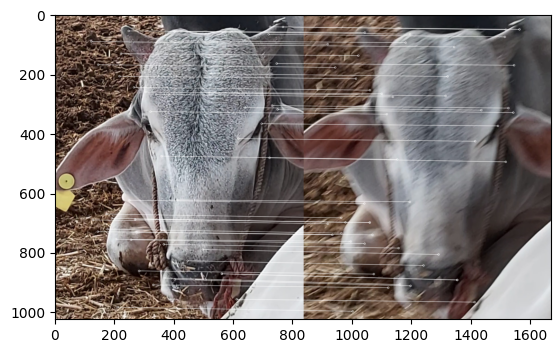

0.06692320562154927 0
0.0 0
0.01694053870913095 0
0.0 0
0.060716454159077116 0
0.07084661707403471 5
0.033461602810774635 5
0.05964807634953773 5
23.991969215325415 8
0.016730801405387317 8
0.0 8
0.0 8
0.07501875468867217 8
0.0 8
0.03163555836760519 8
0.09236453201970443 8
0.12185215272136475 8
0.0 8
0.033461602810774635 8
0.0 8
0.04253509145044662 8
0.0 8
0.06412311638345623 8
0.05884660651235779 8
0.02452783909737552 8
0.03663674665689687 8
0.0 8
0.0 8
0.0 8
0.02262443438914027 8
0.14461315979754158 8
0.0 8
0.0 8
0.24752475247524752 8
0.017605633802816902 8
0.0683526999316473 8
0.053304904051172705 8
0.0 8
0.016730801405387317 8
0.0423908435777872 8
0.016730801405387317 8
0.05377789728421619 8
0.0 8
0.0 8
0.061031431187061336 8
0.0576036866359447 8
0.029112081513828242 8
0.016730801405387317 8
0.02190580503833516 8
0.0 8
0.0 8
0.016730801405387317 8
0.06116207951070336 8
0.0 8
0.0836540070269366 8
0.033461602810774635 8
0.03418803418803419 8
0.03756574004507889 8
0.08203445447087777 

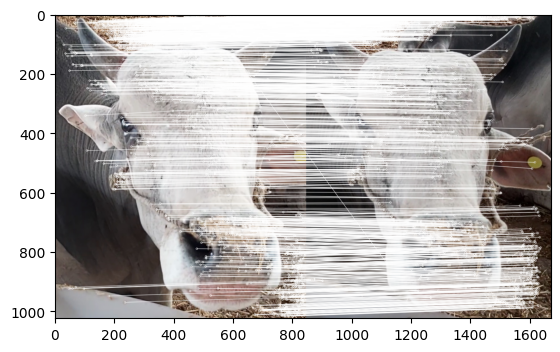

0.03418803418803419 0
0.0 0
0.0 0
0.05998800239952009 3
0.06837606837606838 4
0.03418803418803419 4
0.06837606837606838 4
0.0 4
0.0 4
0.03418803418803419 4
0.06837606837606838 4
0.0 4
0.037509377344336084 4
0.03418803418803419 4
0.0 4
0.03418803418803419 4
0.04061738424045491 4
0.03418803418803419 4
0.0 4
0.0 4
0.04253509145044662 4
0.0 4
0.06837606837606838 4
0.03418803418803419 4
0.10256410256410256 24
0.03418803418803419 24
0.03418803418803419 24
0.0 24
0.03418803418803419 24
0.0 24
0.0 24
0.06837606837606838 24
0.06837606837606838 24
0.24752475247524752 33
0.06837606837606838 33
0.06837606837606838 33
0.053304904051172705 33
0.0 33
0.03418803418803419 33
0.03418803418803419 33
0.03418803418803419 33
0.06837606837606838 33
0.0 33
0.25773195876288657 43
0.06837606837606838 43
0.0 43
0.0 43
0.0 43
0.10256410256410256 43
0.10256410256410256 43
0.0 43
0.0 43
0.03418803418803419 43
0.058105752469494475 43
0.06837606837606838 43
0.0 43
100.0 56
0.15026296018031557 56
0.06837606837606838 5

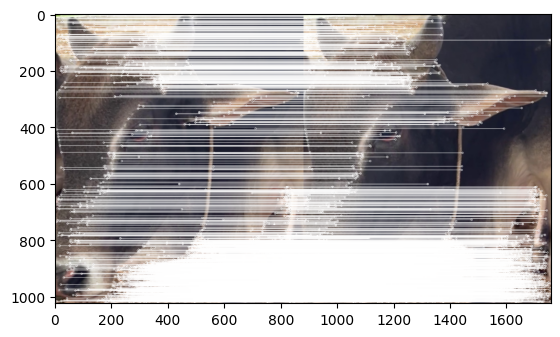

0.03467406380027739 0
0.10402219140083217 1
0.06934812760055478 1
0.0 1
0.03467406380027739 1
0.13869625520110956 5
0.06934812760055478 5
0.06934812760055478 5
0.06934812760055478 5
0.03467406380027739 5
0.03467406380027739 5
0.0 5
0.0 5
0.03467406380027739 5
0.06934812760055478 5
0.03467406380027739 5
0.0 5
0.10402219140083217 5
0.0 5
0.0 5
0.0 5
0.06934812760055478 5
0.0 5
0.03467406380027739 5
0.03467406380027739 5
0.06934812760055478 5
0.06934812760055478 5
0.06934812760055478 5
0.06934812760055478 5
0.0 5
0.0 5
0.06934812760055478 5
0.03467406380027739 5
0.24752475247524752 33
0.0 33
0.03467406380027739 33
0.0 33
0.0 33
0.06934812760055478 33
0.0 33
0.03467406380027739 33
0.0 33
0.0 33
0.3865979381443299 43
0.13869625520110956 43
0.0 43
0.0 43
0.0 43
0.03467406380027739 43
0.03467406380027739 43
0.03467406380027739 43
0.10402219140083217 43
0.03467406380027739 43
0.0 43
0.0 43
0.03467406380027739 43
0.10402219140083217 43
0.0 43
0.03467406380027739 43
0.03467406380027739 43
0.0346

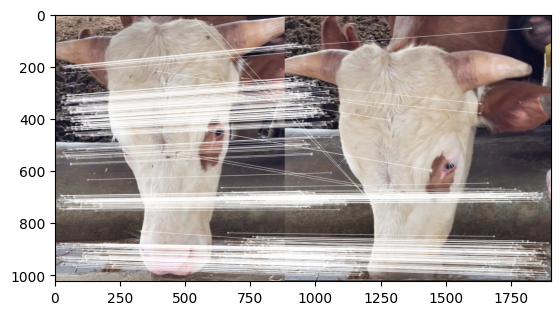

0.08071025020177562 0
0.0 0
0.24213075060532688 2
0.08071025020177562 2
0.08071025020177562 2
0.16142050040355124 2
0.16142050040355124 2
0.08071025020177562 2
0.0 2
0.0 2
0.0 2
0.0 2
0.08071025020177562 2
0.0 2
0.0 2
0.0 2
0.08071025020177562 2
0.08071025020177562 2
0.16142050040355124 2
0.0 2
0.08071025020177562 2
0.0 2
0.08071025020177562 2
0.0 2
0.08071025020177562 2
0.16142050040355124 2
0.08071025020177562 2
0.08071025020177562 2
0.08071025020177562 2
0.08071025020177562 2
0.0 2
0.08071025020177562 2
0.0 2
0.0 2
0.08071025020177562 2
0.08071025020177562 2
0.0 2
0.0 2
0.16142050040355124 2
0.24213075060532688 2
0.24213075060532688 2
0.24213075060532688 2
0.0 2
0.0 2
0.08071025020177562 2
0.08071025020177562 2
0.0 2
0.0 2
0.08071025020177562 2
0.0 2
0.08071025020177562 2
0.16142050040355124 2
0.0 2
0.40355125100887806 53
0.08071025020177562 53
0.0 53
0.24213075060532688 53
0.08071025020177562 53
0.0 53
0.16142050040355124 53
0.0 53
0.0 53
0.0 53
0.08071025020177562 53
0.11061946902

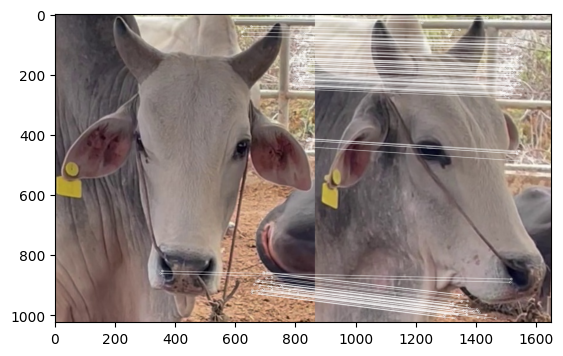

0.02998500749625187 0
0.009995002498750625 0
0.0 0
0.0 0
0.060716454159077116 4
0.07084661707403471 5
0.02998500749625187 5
0.0 5
0.0491320013101867 5
0.01999000499750125 5
0.028169014084507043 5
0.06642311524410495 5
0.11252813203300824 12
0.01768346595932803 12
0.0 12
0.12315270935960591 15
0.04061738424045491 15
0.0399800099950025 15
0.6395614435815441 18
0.3246753246753247 18
0.12760527435133986 18
0.059090013787669884 18
0.032061558191728116 18
0.07846214201647705 18
0.04905567819475104 18
0.018318373328448434 18
0.011723329425556858 18
0.03139060374594538 18
0.01999000499750125 18
0.0 18
0.07230657989877079 18
0.01999000499750125 18
0.02983293556085919 18
0.0 18
0.0 18
0.022784233310549098 18
0.053304904051172705 18
0.554016620498615 18
0.01999000499750125 18
0.0423908435777872 18
0.032589212970506765 18
0.05377789728421619 18
0.06557377049180328 18
0.0 18
0.12206286237412267 18
0.0576036866359447 18
0.058224163027656484 18
0.015659254619480114 18
0.02190580503833516 18
0.0454132

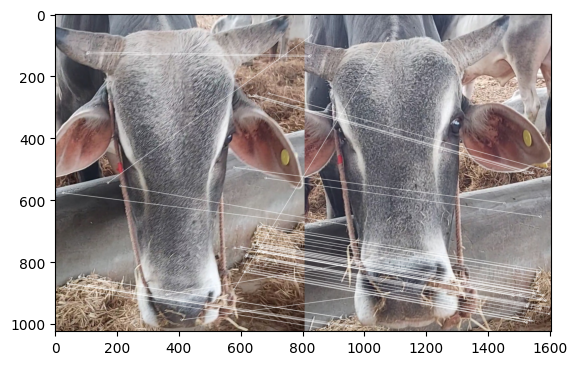

0.025601638504864313 0
0.025601638504864313 0
0.025601638504864313 0
0.0 0
0.025601638504864313 0
0.07680491551459294 5
0.051203277009728626 5
0.029824038174768867 5
0.0 5
0.07680491551459294 5
0.0 5
0.0 5
0.07501875468867217 5
0.0 5
0.0 5
0.03078817733990148 5
0.0 5
0.025601638504864313 5
0.025601638504864313 5
0.0 5
0.04253509145044662 5
0.025601638504864313 5
0.032061558191728116 5
0.0 5
0.025601638504864313 5
0.025601638504864313 5
0.025601638504864313 5
0.025601638504864313 5
0.0 5
0.051203277009728626 5
0.0 5
0.025601638504864313 5
0.02983293556085919 5
0.0 5
0.0 5
0.0 5
0.053304904051172705 5
0.2770083102493075 37
2.3041474654377883 38
0.051203277009728626 38
0.025601638504864313 38
0.08066684592632428 38
0.0 38
0.0 38
0.0 38
0.0 38
0.08733624454148471 38
0.0 38
0.025601638504864313 38
0.051203277009728626 38
0.07680491551459294 38
0.051203277009728626 38
0.051203277009728626 38
0.17431725740848344 38
0.025601638504864313 38
0.025601638504864313 38
0.0 38
0.0 38
0.08203445447087

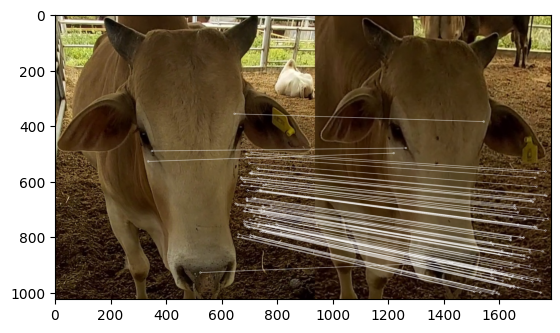

0.009592326139088728 0
0.01815211472136504 1
0.01694053870913095 1
0.11997600479904018 3
0.04047763610605141 3
0.017711654268508677 3
0.0 3
0.029824038174768867 3
0.016377333770062234 3
0.00764525993883792 3
0.056338028169014086 3
0.09963467286615742 3
0.0 3
0.03536693191865606 3
0.03163555836760519 3
0.09236453201970443 3
0.04061738424045491 3
0.007101768340316739 3
0.0 3
0.0 3
0.04253509145044662 3
0.0 3
0.032061558191728116 3
0.0 3
0.02452783909737552 3
0.03663674665689687 3
0.023446658851113716 3
0.020927069163963585 3
0.0 3
0.0 3
0.07230657989877079 3
0.04181301220939957 3
0.02983293556085919 3
0.24752475247524752 33
0.052816901408450696 33
0.022784233310549098 33
0.053304904051172705 33
0.2770083102493075 37
0.0 37
0.0 37
0.0 37
0.0 37
0.0 37
0.0 37
0.091547146780592 37
0.08640552995391705 37
0.058224163027656484 37
0.015659254619480114 37
0.04381161007667032 37
0.022706630336058128 37
0.027770063871146906 37
0.026305405760883863 37
0.020387359836901122 37
0.11621150493898895 37


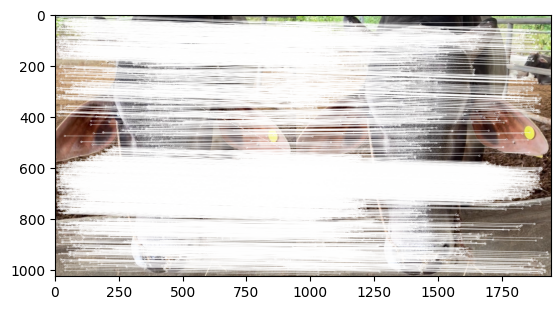

0.03195909236177692 0
0.0 0
0.0 0
0.0 0
0.0 0
0.03195909236177692 0
0.1278363694471077 6
0.09587727708533077 6
0.0 6
0.0 6
0.0 6
0.0 6
0.037509377344336084 6
0.06391818472355384 6
0.0 6
0.0 6
0.04061738424045491 6
0.03195909236177692 6
0.0 6
0.0 6
0.0 6
0.03195909236177692 6
0.0 6
0.0 6
0.0 6
0.06391818472355384 6
0.03195909236177692 6
0.06391818472355384 6
0.0 6
0.0 6
0.0 6
0.03195909236177692 6
0.09587727708533077 6
0.0 6
0.0 6
0.03195909236177692 6
0.053304904051172705 6
0.2770083102493075 37
0.06391818472355384 37
0.03195909236177692 37
0.0 37
0.0 37
0.0 37
0.0 37
0.0 37
0.03195909236177692 37
0.0 37
0.03195909236177692 37
0.06391818472355384 37
0.0 37
0.0 37
0.03195909236177692 37
0.03195909236177692 37
0.0 37
0.03195909236177692 37
0.03195909236177692 37
0.06837606837606838 37
0.0 37
0.03195909236177692 37
0.10135135135135136 37
0.06391818472355384 37
0.09587727708533077 37
0.0377643504531722 37
0.06540222367560497 37
0.0 37
0.2028397565922921 37
0.0 37
0.11467889908256881 37
0.0

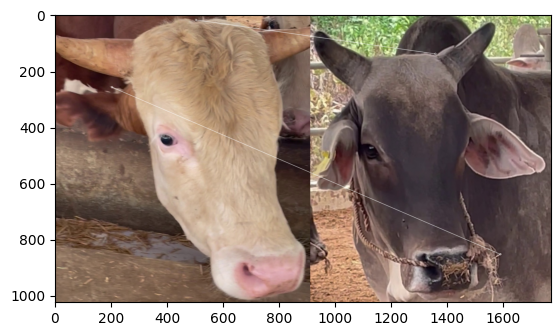

0.0 0
0.11025358324145534 1
0.11025358324145534 1
0.11025358324145534 1
0.0 1
0.2205071664829107 5
0.11025358324145534 5
0.11025358324145534 5
0.0 5
0.0 5
0.0 5
0.33076074972436603 11
0.11025358324145534 11
0.0 11
0.2205071664829107 11
0.0 11
0.2205071664829107 11
0.2205071664829107 11
0.0 11
0.0 11
0.0 11
0.0 11
0.0 11
0.11025358324145534 11
0.2205071664829107 11
0.2205071664829107 11
0.11025358324145534 11
0.0 11
0.11025358324145534 11
0.0 11
0.0 11
0.11025358324145534 11
0.11025358324145534 11
0.24752475247524752 11
0.0 11
0.11025358324145534 11
0.0 11
0.8310249307479225 37
0.0 37
0.11025358324145534 37
0.11025358324145534 37
0.11025358324145534 37
0.11025358324145534 37
0.0 37
0.11025358324145534 37
0.11025358324145534 37
0.11025358324145534 37
0.11025358324145534 37
0.0 37
0.11025358324145534 37
0.0 37
0.0 37
0.11025358324145534 37
0.11025358324145534 37
0.0 37
0.0 37
0.11025358324145534 37
0.0 37
0.2205071664829107 37
0.0 37
0.11025358324145534 37
0.0 37
0.11025358324145534 37
0.

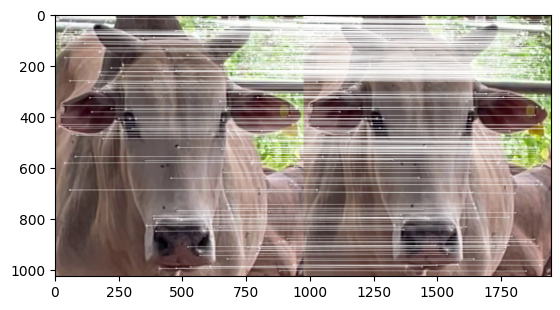

0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.04698144233027954 6
0.05964807634953773 7
0.0 7
0.0 7
0.056338028169014086 7
0.033211557622052475 7
0.0 7
0.02349072116513977 7
0.0 7
0.03078817733990148 7
0.04061738424045491 7
0.04698144233027954 7
0.0 7
0.0 7
0.0 7
0.02349072116513977 7
0.0 7
0.04698144233027954 7
0.0 7
0.02349072116513977 7
0.02349072116513977 7
0.0 7
0.0 7
0.04698144233027954 7
0.0 7
0.04698144233027954 7
0.0 7
0.24752475247524752 33
0.02349072116513977 33
0.02349072116513977 33
0.0 33
0.0 33
0.04698144233027954 33
0.02349072116513977 33
0.0 33
0.026888948642108095 33
0.06557377049180328 33
0.0 33
0.0 33
0.08640552995391705 33
0.058224163027656484 33
0.0 33
0.02349072116513977 33
0.0 33
0.0 33
0.02349072116513977 33
0.02349072116513977 33
0.0 33
0.0 33
0.04698144233027954 33
0.06837606837606838 33
0.03756574004507889 33
0.0 33
0.033783783783783786 33
0.0 33
0.02349072116513977 33
0.11329305135951663 33
0.06540222367560497 33
0.0 33
0.2028397565922921 33
0.0 33
1.37614678899082

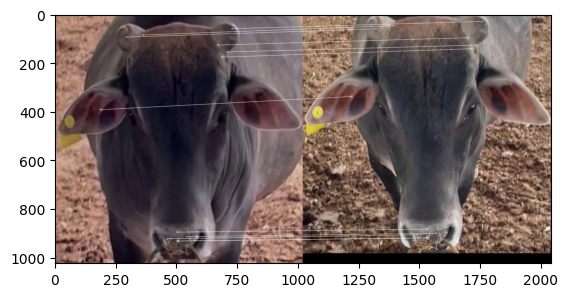

0.01726817475392851 0
0.0 0
0.03453634950785702 2
0.05998800239952009 3
0.0 3
0.035423308537017355 3
0.06907269901571404 6
0.0 6
2.607494387843205 8
0.03453634950785702 8
0.0 8
0.033211557622052475 8
0.22505626406601648 8
0.05305039787798408 8
0.06327111673521038 8
0.06157635467980296 8
0.04061738424045491 8
0.0 8
0.01726817475392851 8
0.0 8
0.0 8
0.039393342525113256 8
0.1603077909586406 8
0.0 8
0.0 8
0.03663674665689687 8
0.0 8
0.01726817475392851 8
0.01726817475392851 8
0.06787330316742081 8
0.14461315979754158 8
0.03453634950785702 8
0.0 8
0.0 8
0.017605633802816902 8
0.045568466621098196 8
0.0 8
0.0 8
0.01726817475392851 8
0.0211954217888936 8
0.0 8
0.026888948642108095 8
0.03278688524590164 8
0.0 8
0.0 8
0.08640552995391705 8
0.029112081513828242 8
0.0 8
0.02190580503833516 8
0.03453634950785702 8
0.03453634950785702 8
0.0 8
0.040774719673802244 8
0.058105752469494475 8
0.03453634950785702 8
0.01726817475392851 8
0.03418803418803419 8
0.03756574004507889 8
0.027344818156959255 8


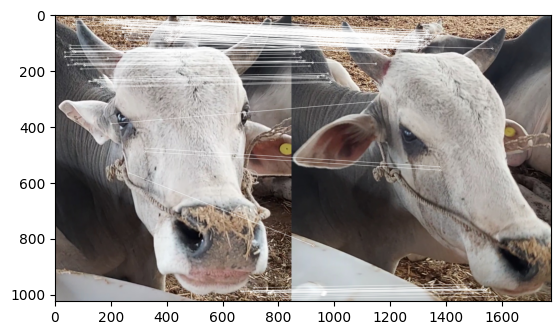

0.01598976654940838 0
0.0 0
0.0338810774182619 2
0.0 2
0.060716454159077116 4
0.035423308537017355 4
0.04796929964822513 4
0.029824038174768867 4
0.03275466754012447 4
0.03197953309881676 4
0.14084507042253522 10
0.06642311524410495 10
0.037509377344336084 10
0.01768346595932803 10
0.0 10
0.03078817733990148 10
0.12185215272136475 10
0.0 10
0.01598976654940838 10
0.0 10
0.0 10
0.059090013787669884 10
0.09618467457518436 10
0.0 10
0.0 10
0.018318373328448434 10
0.03197953309881676 10
0.01598976654940838 10
0.03197953309881676 10
0.02262443438914027 10
0.0 10
0.01598976654940838 10
0.02983293556085919 10
0.0 10
0.0 10
0.0 10
0.21321961620469082 36
0.2770083102493075 37
0.0 37
0.0423908435777872 37
0.016294606485253382 37
0.05377789728421619 37
0.0 37
0.0 37
0.061031431187061336 37
0.0 37
0.0 37
0.0 37
0.04381161007667032 37
0.06395906619763352 37
0.0 37
0.0 37
0.020387359836901122 37
0.11621150493898895 37
0.03197953309881676 37
0.03197953309881676 37
0.06837606837606838 37
0.0 37
0.1367

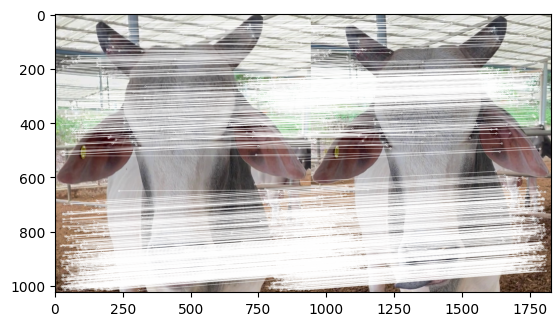

0.0 0
0.0 0
0.0 0
0.05998800239952009 3
0.060716454159077116 4
0.035423308537017355 4
0.030632562413845914 4
0.05964807634953773 4
0.0491320013101867 4
0.015316281206922957 4
0.028169014084507043 4
0.06642311524410495 11
0.037509377344336084 11
0.01768346595932803 11
0.03163555836760519 11
0.06157635467980296 11
0.04061738424045491 11
0.030632562413845914 11
0.015316281206922957 11
0.3246753246753247 19
0.08507018290089324 19
0.07878668505022651 19
0.06412311638345623 19
0.0 19
0.04905567819475104 19
0.03663674665689687 19
0.030632562413845914 19
0.06126512482769183 19
0.0765814060346148 19
0.06787330316742081 19
0.0 19
0.06126512482769183 19
0.05966587112171838 19
0.0 19
0.035211267605633804 19
0.045568466621098196 19
0.15991471215351813 19
0.0 19
0.030632562413845914 19
0.0211954217888936 19
0.0 19
0.026888948642108095 19
0.03278688524590164 19
0.0 19
0.061031431187061336 19
0.0 19
0.029112081513828242 19
0.0 19
0.04381161007667032 19
0.030632562413845914 19
0.0 19
0.0306325624138459

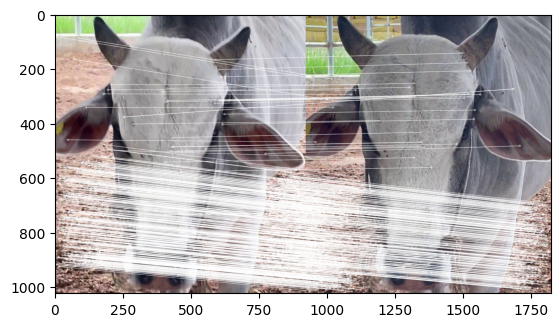

0.0 0
0.273972602739726 1
0.0 1
0.0 1
0.0 1
0.547945205479452 5
0.273972602739726 5
0.0 5
0.273972602739726 5
0.273972602739726 5
0.273972602739726 5
0.0 5
0.273972602739726 5
0.0 5
0.0 5
0.273972602739726 5
0.273972602739726 5
0.273972602739726 5
0.0 5
0.0 5
0.0 5
0.273972602739726 5
0.273972602739726 5
0.0 5
0.0 5
0.273972602739726 5
0.0 5
0.0 5
0.0 5
0.0 5
2.191780821917808 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.547945205479452 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.273972602739726 30
0.0 30
0.0 30
0.0 30
0.0 30
0.273972602739726 30
0.273972602739726 30
0.0 30
0.0 30
0.547945205479452 30
0.0 30
0.273972602739726 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.273972602739726 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.547945205479452 30
0.0 30
0.0 30
0.0 30
0.0 30
0.0 30
0.547945205479452 30
0.0 30
0.273972602739726 30
0.273972602739726 30
0.0 30
0.0 30
The max Score is :2.191780821917808
----------------------------

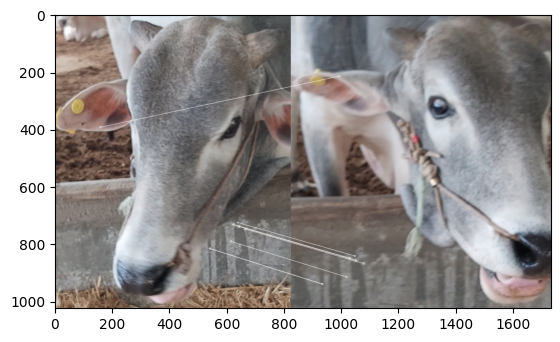

0.012274456855284154 0
0.0 0
0.01694053870913095 2
0.1799640071985603 3
0.0 3
0.0 3
0.024548913710568308 3
0.0 3
0.03275466754012447 3
0.024548913710568308 3
0.5070422535211268 10
0.0 10
0.0 10
0.05305039787798408 10
0.03163555836760519 10
0.06157635467980296 10
0.04061738424045491 10
0.024548913710568308 10
0.036823370565852456 10
0.0 10
0.04253509145044662 10
0.0 10
0.06412311638345623 10
0.019615535504119264 10
0.0 10
0.0 10
0.0 10
0.0 10
0.0 10
0.02262443438914027 10
0.07230657989877079 10
0.012274456855284154 10
0.14916467780429593 10
0.24752475247524752 10
0.052816901408450696 10
0.045568466621098196 10
0.053304904051172705 10
0.0 10
0.0 10
0.0847816871555744 10
0.016294606485253382 10
0.05377789728421619 10
0.0 10
0.12886597938144329 10
0.061031431187061336 10
0.08640552995391705 10
0.029112081513828242 10
0.015659254619480114 10
0.04381161007667032 10
0.024548913710568308 10
0.04165509580672035 10
0.026305405760883863 10
0.0 10
0.058105752469494475 10
0.012274456855284154 10
0.

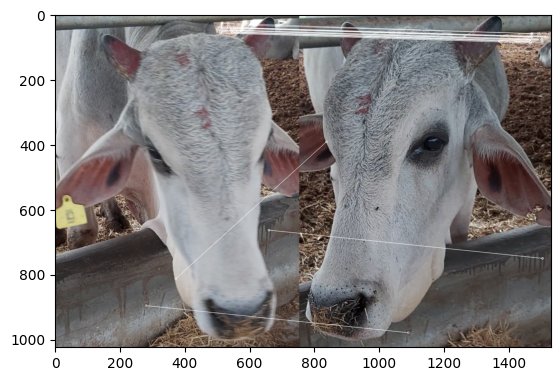

0.03492229788720098 0
0.0 0
0.0 0
0.05998800239952009 3
0.020238818053025704 3
0.035423308537017355 3
0.08730574471800244 6
0.11929615269907547 7
0.03492229788720098 7
0.03492229788720098 7
0.0 7
0.06642311524410495 7
0.15003750937734434 12
0.0 12
0.09490667510281556 12
0.0 12
0.04061738424045491 12
0.05238344683080147 12
0.01746114894360049 12
0.0 12
0.04253509145044662 12
0.019696671262556628 12
0.0 12
0.0 12
0.02452783909737552 12
0.03663674665689687 12
0.03492229788720098 12
0.0 12
0.06984459577440195 12
0.02262443438914027 12
0.07230657989877079 12
0.0 12
0.05966587112171838 12
0.0 12
0.017605633802816902 12
0.022784233310549098 12
0.0 12
0.2770083102493075 37
0.03492229788720098 37
0.0211954217888936 37
0.12222804260520342 37
0.026888948642108095 37
0.0 37
0.0 37
0.0 37
0.0576036866359447 37
0.058224163027656484 37
40.66701588964554 47
0.0 47
0.05238344683080147 47
0.03492229788720098 47
0.03492229788720098 47
0.040774719673802244 47
0.0 47
0.06984459577440195 47
0.0 47
0.0 47
0.

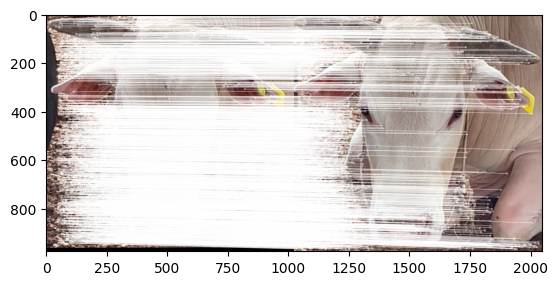

0.04827419744146754 0
0.02413709872073377 0
0.0 0
0.05998800239952009 3
0.02413709872073377 3
0.04827419744146754 3
0.02413709872073377 3
0.029824038174768867 3
0.02413709872073377 3
0.02413709872073377 3
0.028169014084507043 3
0.1328462304882099 11
0.0 11
0.0724112961622013 11
0.03163555836760519 11
0.0 11
0.04061738424045491 11
0.02413709872073377 11
0.04827419744146754 11
0.0 11
0.04253509145044662 11
0.04827419744146754 11
0.0 11
0.0 11
0.0 11
0.04827419744146754 11
5.1653391262370265 26
0.0 26
0.04827419744146754 26
0.0 26
0.07230657989877079 26
0.04827419744146754 26
0.02983293556085919 26
0.24752475247524752 26
0.04827419744146754 26
0.04827419744146754 26
0.15991471215351813 26
0.8310249307479225 26
0.04827419744146754 26
0.02413709872073377 26
0.0724112961622013 26
0.0 26
0.0 26
0.0 26
0.061031431187061336 26
0.02880184331797235 26
0.029112081513828242 26
0.02413709872073377 26
0.02413709872073377 26
0.0 26
0.0724112961622013 26
0.0 26
0.0 26
0.0 26
0.02413709872073377 26
0.0 

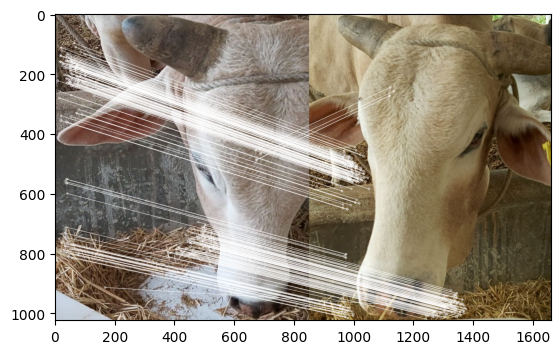

0.009865824782951855 0
0.0 0
0.050821616127392846 2
0.0 2
0.08095527221210282 4
0.053134962805526036 4
0.009865824782951855 4
0.029824038174768867 4
0.0491320013101867 4
37.27308602999211 9
0.08450704225352113 9
0.0 9
0.037509377344336084 9
0.01768346595932803 9
0.09490667510281556 9
0.06157635467980296 9
0.0 9
0.01973164956590371 9
0.0 9
0.0 9
0.0 9
0.019696671262556628 9
0.0 9
0.03923107100823853 9
0.04905567819475104 9
0.018318373328448434 9
0.011723329425556858 9
0.020927069163963585 9
0.01973164956590371 9
0.09049773755656108 9
0.21691973969631237 9
0.029597474348855568 9
0.0 9
0.0 9
0.017605633802816902 9
0.0 9
0.0 9
0.0 9
0.01973164956590371 9
0.0211954217888936 9
0.016294606485253382 9
0.0 9
0.09836065573770492 9
0.0 9
0.0 9
0.02880184331797235 9
0.0 9
0.03131850923896023 9
0.02190580503833516 9
0.011353315168029064 9
0.04165509580672035 9
0.0 9
0.0 9
0.0 9
0.012205541315757355 9
0.01973164956590371 9
0.0 9
0.03756574004507889 9
0.027344818156959255 9
0.0 9
0.0 9
0.018261504747

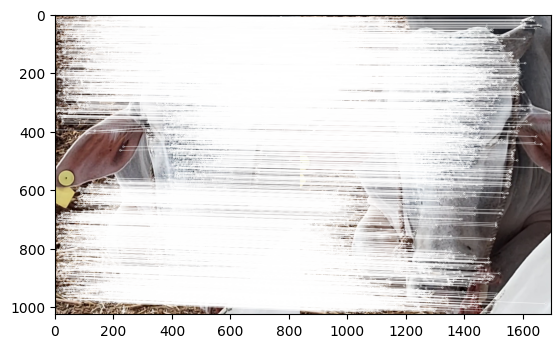

0.010760787689658883 0
0.010760787689658883 0
0.050821616127392846 2
0.05998800239952009 3
0.08095527221210282 4
0.017711654268508677 4
0.03228236306897665 4
0.029824038174768867 4
0.03275466754012447 4
0.010760787689658883 4
0.056338028169014086 4
0.0 4
4.238559639909977 12
0.03536693191865606 12
0.0 12
0.03078817733990148 12
0.0 12
0.010760787689658883 12
0.0 12
0.0 12
0.0 12
0.059090013787669884 12
0.0 12
0.019615535504119264 12
0.0 12
0.0 12
0.011723329425556858 12
0.021521575379317766 12
0.010760787689658883 12
0.0 12
0.07230657989877079 12
0.010760787689658883 12
0.02983293556085919 12
0.0 12
0.052816901408450696 12
0.022784233310549098 12
0.0 12
0.2770083102493075 12
0.021521575379317766 12
0.0 12
0.04888381945576015 12
0.08066684592632428 12
0.03278688524590164 12
0.0 12
0.030515715593530668 12
0.02880184331797235 12
0.029112081513828242 12
0.0 12
0.04381161007667032 12
0.0 12
0.0 12
0.03945810864132579 12
0.06116207951070336 12
0.0 12
0.0 12
0.010760787689658883 12
0.136752136

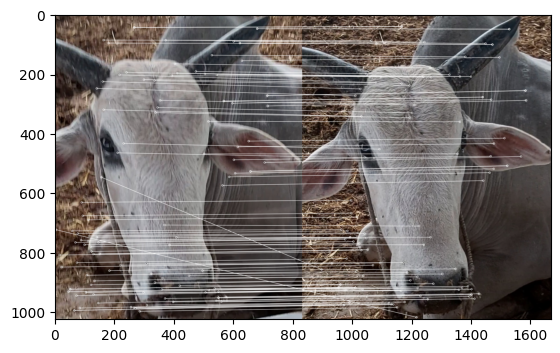

0.03078817733990148 0
0.0 0
0.06157635467980296 2
0.0 2
0.06157635467980296 2
0.06157635467980296 2
0.03078817733990148 2
0.0 2
0.03078817733990148 2
0.03078817733990148 2
0.03078817733990148 2
0.033211557622052475 2
0.07501875468867217 12
0.03078817733990148 12
0.06327111673521038 12
0.06157635467980296 12
0.08123476848090982 16
0.03078817733990148 16
0.03078817733990148 16
0.0 16
0.0 16
0.03078817733990148 16
0.032061558191728116 16
0.03078817733990148 16
0.06157635467980296 16
0.0 16
0.09236453201970443 26
0.09236453201970443 26
0.09236453201970443 26
0.03078817733990148 26
0.07230657989877079 26
0.0 26
0.09236453201970443 26
0.0 26
0.03078817733990148 26
0.06157635467980296 26
0.053304904051172705 26
0.2770083102493075 37
0.06157635467980296 37
0.12315270935960591 37
0.03078817733990148 37
0.03078817733990148 37
0.03278688524590164 37
0.0 37
0.09236453201970443 37
0.03078817733990148 37
0.06157635467980296 37
0.03078817733990148 37
0.09236453201970443 37
0.0 37
0.03078817733990148 

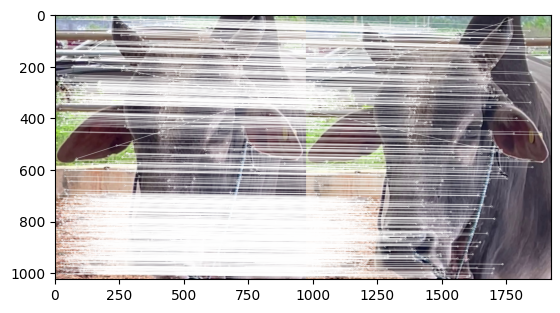

0.009592326139088728 0
6.062021296469269 1
0.01694053870913095 1
0.0 1
0.020238818053025704 1
0.035423308537017355 1
0.009753242953281966 1
0.0 1
0.03275466754012447 1
0.018681113394358302 1
0.028169014084507043 1
0.09963467286615742 1
0.0 1
0.01768346595932803 1
0.06327111673521038 1
0.03078817733990148 1
0.08123476848090982 1
0.028021670091537453 1
0.0 1
0.0 1
0.04253509145044662 1
0.059090013787669884 1
0.06412311638345623 1
0.019615535504119264 1
0.0 1
0.0 1
0.035169988276670575 1
0.020927069163963585 1
0.0 1
0.0 1
0.0 1
0.0 1
0.0 1
0.49504950495049505 1
0.017605633802816902 1
0.0 1
0.053304904051172705 1
0.0 1
0.009340556697179151 1
0.0211954217888936 1
0.016294606485253382 1
0.026888948642108095 1
0.03278688524590164 1
0.12886597938144329 1
0.030515715593530668 1
0.02880184331797235 1
0.0 1
0.03131850923896023 1
0.0 1
0.03405994550408719 1
0.0 1
0.03945810864132579 1
0.040774719673802244 1
0.0 1
0.04882216526302942 1
0.009340556697179151 1
0.0 1
0.03756574004507889 1
0.0820344544

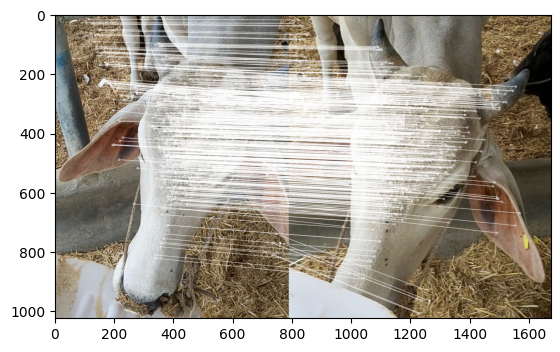

0.041631973355537054 0
0.013877324451845686 0
0.01694053870913095 0
0.0 0
0.020238818053025704 0
0.0 0
0.013877324451845686 0
0.0 0
0.016377333770062234 0
0.013877324451845686 0
0.028169014084507043 0
0.1328462304882099 11
0.0 11
0.01768346595932803 11
0.03163555836760519 11
0.03078817733990148 11
0.08123476848090982 11
0.041631973355537054 11
0.013877324451845686 11
0.0 11
0.04253509145044662 11
0.019696671262556628 11
0.09618467457518436 11
0.0 11
0.0 11
0.03663674665689687 11
0.013877324451845686 11
0.0 11
0.02775464890369137 11
0.0 11
0.0 11
0.02775464890369137 11
0.02983293556085919 11
0.24752475247524752 33
0.07042253521126761 33
0.045568466621098196 33
0.0 33
0.0 33
0.0 33
0.0423908435777872 33
0.016294606485253382 33
0.026888948642108095 33
0.0 33
0.0 33
0.0 33
0.0 33
0.029112081513828242 33
0.015659254619480114 33
0.0 33
0.013877324451845686 33
0.0 33
0.02775464890369137 33
0.020387359836901122 33
0.0 33
0.013877324451845686 33
0.0 33
0.0 33
0.0 33
0.08203445447087777 33
0.033

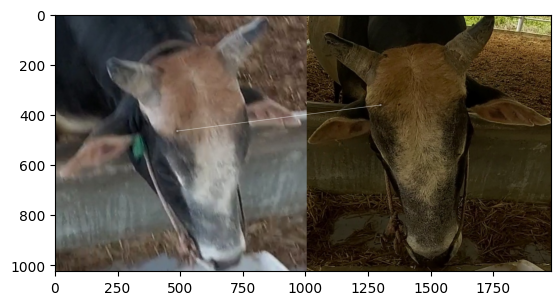

0.0 0
9.393719368306408 1
0.0338810774182619 1
0.05998800239952009 1
0.0 1
0.017711654268508677 1
0.009753242953281966 1
0.11929615269907547 1
0.03275466754012447 1
0.02330097087378641 1
0.0 1
0.06642311524410495 1
0.037509377344336084 1
0.10610079575596816 1
0.0 1
0.03078817733990148 1
0.0 1
0.007766990291262136 1
0.04568296025582458 1
0.0 1
0.0 1
0.059090013787669884 1
0.032061558191728116 1
0.019615535504119264 1
0.04905567819475104 1
0.018318373328448434 1
0.011723329425556858 1
0.010463534581981793 1
0.0 1
0.09049773755656108 1
0.0 1
0.008362602441879913 1
0.02983293556085919 1
0.0 1
0.035211267605633804 1
0.0 1
0.10660980810234541 1
0.2770083102493075 1
0.008588114050154586 1
0.0847816871555744 1
0.016294606485253382 1
0.026888948642108095 1
0.0 1
0.12886597938144329 1
0.030515715593530668 1
0.02880184331797235 1
0.029112081513828242 1
0.0 1
0.04381161007667032 1
0.03405994550408719 1
0.013885031935573453 1
0.026305405760883863 1
0.0 1
0.0 1
0.012205541315757355 1
0.0087680841736

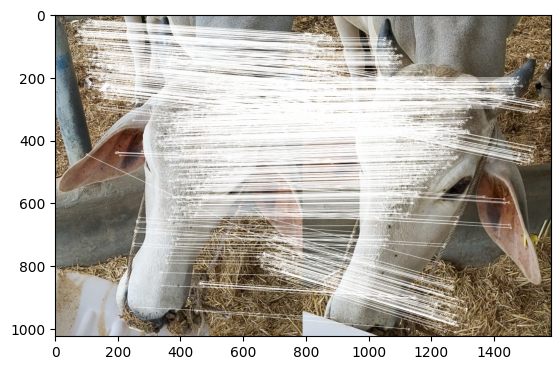

0.0 0
0.021908204622631176 1
0.0 1
0.0 1
0.04047763610605141 4
0.017711654268508677 4
9.31098696461825 6
0.029824038174768867 6
0.03275466754012447 6
0.04381640924526235 6
0.028169014084507043 6
0.0 6
0.0 6
0.0 6
0.03163555836760519 6
0.09236453201970443 6
0.0 6
0.021908204622631176 6
0.034262220191868434 6
0.0 6
0.04253509145044662 6
0.019696671262556628 6
0.032061558191728116 6
0.0 6
0.02452783909737552 6
0.0 6
0.023446658851113716 6
0.010954102311315588 6
0.010954102311315588 6
0.0 6
0.0 6
0.010954102311315588 6
0.02983293556085919 6
0.24752475247524752 6
0.0 6
0.0683526999316473 6
0.10660980810234541 6
0.0 6
0.03286230693394677 6
0.0211954217888936 6
0.06517842594101353 6
0.026888948642108095 6
0.06557377049180328 6
0.0 6
0.061031431187061336 6
0.0 6
0.058224163027656484 6
0.03131850923896023 6
0.02190580503833516 6
0.011353315168029064 6
0.027770063871146906 6
0.026305405760883863 6
0.020387359836901122 6
0.0 6
0.012205541315757355 6
0.021908204622631176 6
0.03418803418803419 6
0.

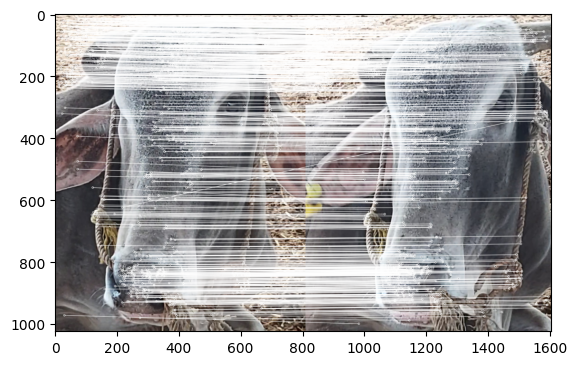

0.0926569376882094 0
0.06949270326615706 0
0.0463284688441047 0
0.0 0
0.0463284688441047 0
0.11582117211026176 5
0.02316423442205235 5
0.08947211452430659 5
0.0926569376882094 5
0.02316423442205235 5
0.2535211267605634 10
0.033211557622052475 10
0.11252813203300824 10
0.02316423442205235 10
0.09490667510281556 10
0.06157635467980296 10
0.04061738424045491 10
0.02316423442205235 10
0.02316423442205235 10
0.0 10
0.04253509145044662 10
0.0463284688441047 10
0.0 10
0.02316423442205235 10
0.0 10
0.0 10
0.02316423442205235 10
0.0 10
0.02316423442205235 10
0.02316423442205235 10
0.0 10
0.0 10
0.0 10
0.0 10
0.0 10
0.0 10
0.053304904051172705 10
0.2770083102493075 37
0.0 37
0.0463284688441047 37
0.02316423442205235 37
0.05377789728421619 37
0.0 37
0.25773195876288657 37
0.0 37
0.0 37
0.058224163027656484 37
0.02316423442205235 37
0.02316423442205235 37
0.0463284688441047 37
0.0463284688441047 37
0.0463284688441047 37
0.0 37
0.0 37
0.06949270326615706 37
0.0 37
0.06837606837606838 37
0.150262960

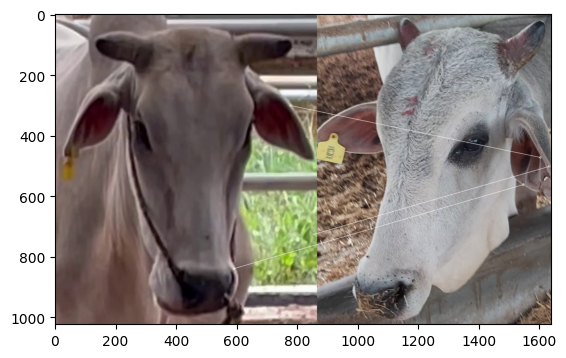

2.4076738609112707 0
0.00907605736068252 0
0.050821616127392846 0
0.05998800239952009 0
0.04047763610605141 0
0.035423308537017355 0
0.019506485906563932 0
0.029824038174768867 0
0.06550933508024893 0
0.0 0
0.08450704225352113 0
0.09963467286615742 0
0.0 0
0.03536693191865606 0
0.03163555836760519 0
0.03078817733990148 0
0.16246953696181965 0
0.007729767334003247 0
0.02284148012791229 0
0.0 0
0.04253509145044662 0
0.0 0
0.032061558191728116 0
0.019615535504119264 0
0.02452783909737552 0
0.018318373328448434 0
0.011723329425556858 0
0.04185413832792717 0
0.009062896501721951 0
0.02262443438914027 0
0.07230657989877079 0
0.0 0
0.0 0
0.24752475247524752 0
0.052816901408450696 0
0.045568466621098196 0
0.0 0
0.0 0
0.017176228100309172 0
0.0211954217888936 0
0.0 0
0.026888948642108095 0
0.03278688524590164 0
0.0 0
0.030515715593530668 0
0.0576036866359447 0
0.029112081513828242 0
0.0 0
0.02190580503833516 0
0.011353315168029064 0
0.05554012774229381 0
0.013152702880441932 0
0.040774719673802

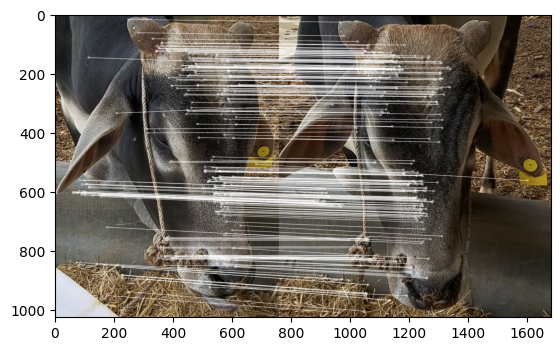

0.05846813486649776 0
0.03897875657766517 0
0.019489378288832584 0
0.23995200959808036 3
0.020238818053025704 3
0.03897875657766517 3
0.0 3
0.029824038174768867 3
0.05846813486649776 3
0.019489378288832584 3
0.056338028169014086 3
0.033211557622052475 3
0.07501875468867217 3
0.03897875657766517 3
0.03163555836760519 3
0.03078817733990148 3
0.04061738424045491 3
0.03897875657766517 3
0.019489378288832584 3
0.0 3
0.0 3
0.039393342525113256 3
0.06412311638345623 3
0.0 3
0.02452783909737552 3
0.019489378288832584 3
0.05846813486649776 3
0.0 3
0.0 3
0.06787330316742081 3
0.14461315979754158 3
0.019489378288832584 3
0.05966587112171838 3
0.0 3
0.03897875657766517 3
0.0 3
0.10660980810234541 3
0.2770083102493075 37
0.03897875657766517 37
0.0635862653666808 37
0.0 37
0.0 37
0.0 37
0.12886597938144329 37
0.0 37
0.08640552995391705 37
0.0 37
0.0 37
0.0 37
1.227830832196453 49
0.03897875657766517 49
0.019489378288832584 49
0.040774719673802244 49
0.058105752469494475 49
0.05846813486649776 49
0.0

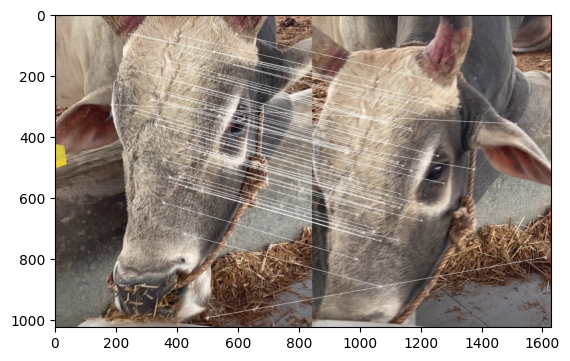

0.019184652278177457 0
6.716282446905064 1
0.0 1
0.0 1
0.04047763610605141 1
0.017711654268508677 1
0.019506485906563932 1
0.08947211452430659 1
0.03275466754012447 1
0.0 1
0.0 1
0.033211557622052475 1
0.0 1
0.03536693191865606 1
0.06327111673521038 1
0.03078817733990148 1
0.0 1
0.00791702953052015 1
0.034262220191868434 1
0.0 1
0.0 1
0.019696671262556628 1
0.032061558191728116 1
0.0 1
0.07358351729212656 1
0.018318373328448434 1
0.035169988276670575 1
0.0 1
0.009062896501721951 1
0.0 1
0.0 1
0.0 1
0.05966587112171838 1
0.24752475247524752 1
0.0 1
0.0683526999316473 1
0.053304904051172705 1
0.2770083102493075 1
0.034352456200618345 1
0.0211954217888936 1
0.0 1
0.05377789728421619 1
0.0 1
0.0 1
0.091547146780592 1
0.0576036866359447 1
0.08733624454148471 1
0.03131850923896023 1
0.0 1
0.0 1
0.05554012774229381 1
0.03945810864132579 1
0.10193679918450561 1
0.0 1
0.012205541315757355 1
0.017536168347216136 1
0.03418803418803419 1
0.0 1
0.05468963631391851 1
0.0 1
0.0 1
0.0 1
0.037764350453

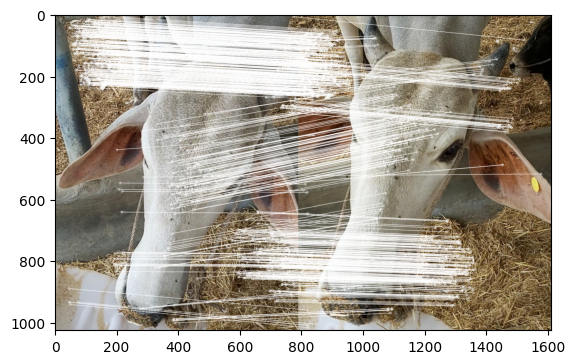

0.013653741125068267 0
0.013653741125068267 0
0.01694053870913095 2
0.05998800239952009 3
0.04047763610605141 3
0.053134962805526036 3
0.013653741125068267 3
0.0 3
0.0491320013101867 3
0.0 3
0.056338028169014086 3
0.033211557622052475 3
0.15003750937734434 12
0.01768346595932803 12
0.15817779183802594 14
0.03078817733990148 14
0.0 14
0.013653741125068267 14
0.013653741125068267 14
0.0 14
0.04253509145044662 14
0.039393342525113256 14
0.0 14
0.019615535504119264 14
0.02452783909737552 14
0.0 14
0.0409612233752048 14
0.013653741125068267 14
0.027307482250136534 14
0.02262443438914027 14
0.07230657989877079 14
0.013653741125068267 14
0.0 14
0.0 14
0.017605633802816902 14
0.022784233310549098 14
0.0 14
0.2770083102493075 37
0.0409612233752048 37
0.0423908435777872 37
0.04888381945576015 37
0.026888948642108095 37
0.0 37
0.0 37
0.030515715593530668 37
0.2304147465437788 37
0.058224163027656484 37
0.03131850923896023 37
0.04381161007667032 37
0.0409612233752048 37
0.05554012774229381 37
31.8

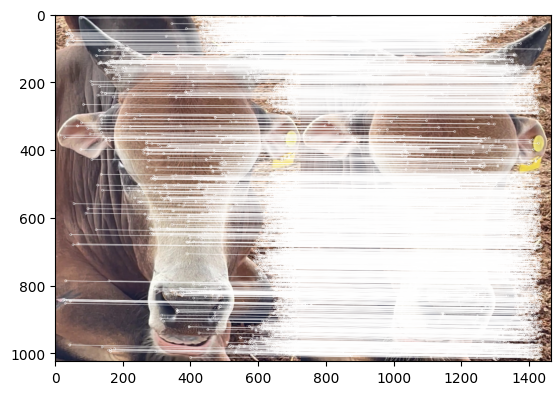

0.25773195876288657 0
0.25773195876288657 0
0.12886597938144329 0
0.0 0
0.3865979381443299 4
0.12886597938144329 4
0.12886597938144329 4
0.0 4
0.0 4
0.0 4
0.0 4
0.25773195876288657 4
0.0 4
0.12886597938144329 4
0.12886597938144329 4
0.12886597938144329 4
0.12886597938144329 4
0.0 4
0.12886597938144329 4
0.0 4
0.0 4
0.12886597938144329 4
0.0 4
0.0 4
0.0 4
0.12886597938144329 4
0.12886597938144329 4
0.12886597938144329 4
0.12886597938144329 4
0.25773195876288657 4
0.0 4
0.12886597938144329 4
0.25773195876288657 4
0.24752475247524752 4
0.12886597938144329 4
0.0 4
0.12886597938144329 4
0.8310249307479225 37
0.0 37
0.12886597938144329 37
0.0 37
0.0 37
0.0 37
0.12886597938144329 37
0.0 37
0.0 37
0.25773195876288657 37
0.3865979381443299 37
0.3865979381443299 37
0.12886597938144329 37
0.0 37
0.0 37
0.0 37
0.25773195876288657 37
0.0 37
0.0 37
0.12886597938144329 37
0.0 37
0.25773195876288657 37
0.3865979381443299 37
0.0 37
0.0 37
0.5154639175257731 37
0.5154639175257731 37
26.54639175257732 64

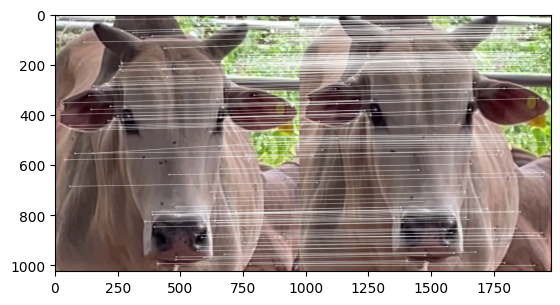

0.0966183574879227 0
0.0966183574879227 0
0.0 0
0.1932367149758454 3
0.0966183574879227 3
0.1932367149758454 3
0.0966183574879227 3
0.0966183574879227 3
0.0966183574879227 3
0.0 3
0.0966183574879227 3
0.0966183574879227 3
0.0 3
0.0966183574879227 3
0.1932367149758454 3
0.0966183574879227 3
0.0 3
0.1932367149758454 3
0.0 3
0.3246753246753247 19
0.0 19
0.0 19
0.0 19
0.0966183574879227 19
0.0 19
0.0 19
0.0966183574879227 19
0.0966183574879227 19
0.0 19
0.0966183574879227 19
0.2898550724637681 19
0.0 19
0.0 19
0.0 19
0.0966183574879227 19
0.0 19
0.0966183574879227 19
0.554016620498615 37
0.0966183574879227 37
0.0966183574879227 37
0.0 37
0.1932367149758454 37
0.1932367149758454 37
0.0 37
0.0 37
0.0 37
0.0 37
0.0 37
0.0966183574879227 37
0.0966183574879227 37
0.0 37
0.0966183574879227 37
0.0966183574879227 37
0.1932367149758454 37
0.0966183574879227 37
0.0 37
0.0966183574879227 37
0.0 37
0.0 37
0.3864734299516908 37
0.2898550724637681 37
0.0 37
0.0966183574879227 37
0.0 37
0.0 37
0.40567951

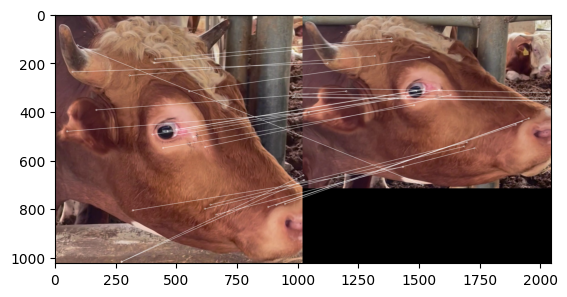

0.02760905577029266 0
0.11043622308117064 1
0.0 1
0.0 1
0.0 1
0.08282716731087797 1
0.05521811154058532 1
0.05964807634953773 1
0.02760905577029266 1
0.0 1
0.056338028169014086 1
0.09963467286615742 1
0.037509377344336084 1
0.02760905577029266 1
0.0 1
0.09236453201970443 1
0.12185215272136475 16
0.13804527885146328 17
0.02760905577029266 17
0.3246753246753247 19
0.0 19
0.02760905577029266 19
0.032061558191728116 19
0.0 19
0.05521811154058532 19
0.0 19
0.05521811154058532 19
0.08282716731087797 19
0.02760905577029266 19
0.0 19
0.07230657989877079 19
0.02760905577029266 19
0.05966587112171838 19
0.24752475247524752 19
0.0 19
0.0 19
0.053304904051172705 19
0.0 19
0.02760905577029266 19
0.02760905577029266 19
0.0 19
0.02760905577029266 19
0.03278688524590164 19
0.0 19
0.030515715593530668 19
0.08640552995391705 19
0.0 19
0.05521811154058532 19
0.0 19
0.08282716731087797 19
0.0 19
0.02760905577029266 19
0.05521811154058532 19
0.058105752469494475 19
0.05521811154058532 19
0.0276090557702926

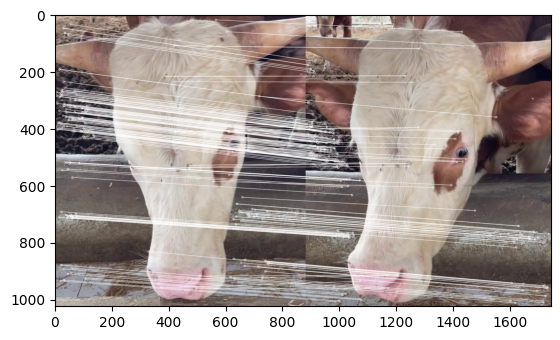

0.0 0
0.0 0
0.0 0
0.11997600479904018 3
0.031416902293433864 3
0.0 3
0.0 3
0.0 3
0.0942507068803016 3
0.06283380458686773 3
0.06283380458686773 3
0.033211557622052475 3
0.0 3
0.06283380458686773 3
0.03163555836760519 3
0.031416902293433864 3
0.04061738424045491 3
0.0 3
0.06283380458686773 3
0.0 3
2.2968949383241175 20
0.0942507068803016 20
0.06412311638345623 20
0.031416902293433864 20
0.0 20
0.031416902293433864 20
0.0 20
0.0 20
0.0 20
0.06283380458686773 20
0.0 20
0.0942507068803016 20
0.0 20
0.24752475247524752 20
0.0 20
0.031416902293433864 20
0.053304904051172705 20
0.2770083102493075 20
0.0 20
0.0 20
0.06283380458686773 20
0.031416902293433864 20
0.0 20
0.12886597938144329 20
0.031416902293433864 20
0.031416902293433864 20
0.06283380458686773 20
0.06283380458686773 20
0.0 20
0.0942507068803016 20
0.031416902293433864 20
0.0 20
0.06283380458686773 20
0.058105752469494475 20
0.031416902293433864 20
0.0942507068803016 20
0.03418803418803419 20
0.0 20
0.031416902293433864 20
0.101351

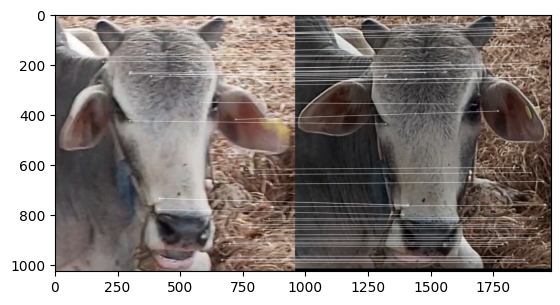

0.0 0
0.07412898443291327 1
0.0 1
0.0 1
0.0 1
0.14825796886582654 5
0.0 5
0.0 5
0.14825796886582654 5
0.0 5
0.0 5
0.07412898443291327 5
0.14825796886582654 5
0.0 5
0.07412898443291327 5
0.14825796886582654 5
0.0 5
0.14825796886582654 5
0.07412898443291327 5
0.0 5
0.07412898443291327 5
0.07412898443291327 5
0.07412898443291327 5
0.0 5
0.0 5
0.2223869532987398 25
0.07412898443291327 25
0.2965159377316531 27
0.07412898443291327 27
0.14825796886582654 27
0.0 27
0.07412898443291327 27
0.07412898443291327 27
0.24752475247524752 27
0.0 27
0.0 27
0.07412898443291327 27
0.0 27
0.07412898443291327 27
0.0 27
0.0 27
0.0 27
0.0 27
0.0 27
0.07412898443291327 27
0.14825796886582654 27
0.0 27
0.14825796886582654 27
0.07412898443291327 27
0.0 27
0.14825796886582654 27
0.0 27
0.2223869532987398 27
0.0 27
0.07412898443291327 27
0.07412898443291327 27
0.07412898443291327 27
0.37064492216456635 57
0.07412898443291327 57
0.0 57
0.0 57
0.07412898443291327 57
0.07412898443291327 57
0.0 57
0.0 57
0.0 57
0.3095

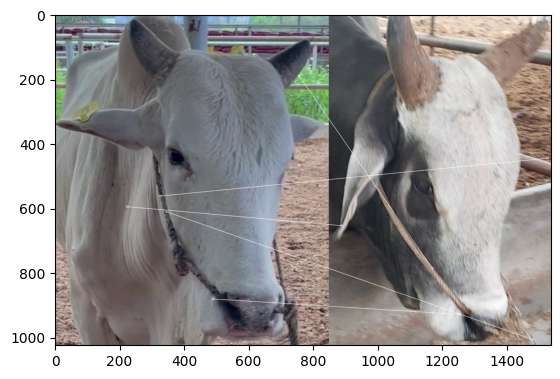

0.023629489603024575 0
0.0 0
0.04725897920604915 2
0.0 2
0.023629489603024575 2
0.07088846880907373 5
0.04725897920604915 5
0.029824038174768867 5
0.0 5
0.04725897920604915 5
0.028169014084507043 5
0.1328462304882099 11
0.037509377344336084 11
0.07088846880907373 11
0.0 11
0.09236453201970443 11
0.04061738424045491 11
0.0945179584120983 11
0.0 11
0.0 11
0.0 11
0.023629489603024575 11
0.032061558191728116 11
0.023629489603024575 11
0.04905567819475104 11
0.023629489603024575 11
0.0945179584120983 11
0.0 11
0.04725897920604915 11
0.023629489603024575 11
0.07230657989877079 11
0.0 11
0.0 11
0.0 11
0.023629489603024575 11
0.023629489603024575 11
0.0 11
0.554016620498615 37
0.07088846880907373 37
0.0 37
0.0 37
0.026888948642108095 37
0.0 37
0.25773195876288657 37
0.0 37
0.02880184331797235 37
0.058224163027656484 37
0.04725897920604915 37
0.04725897920604915 37
0.07088846880907373 37
0.023629489603024575 37
0.0 37
0.0 37
0.058105752469494475 37
0.0 37
0.023629489603024575 37
0.0341880341880

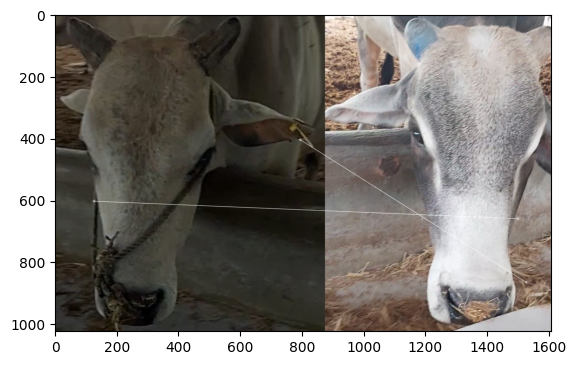

0.021215657154980375 0
0.0 0
0.01694053870913095 0
0.0 0
0.020238818053025704 0
0.035423308537017355 5
0.021215657154980375 5
0.05964807634953773 7
0.0491320013101867 7
0.021215657154980375 7
0.0 7
0.06642311524410495 11
0.11252813203300824 12
0.0 12
0.03163555836760519 12
0.09236453201970443 12
0.0 12
0.03182348573247056 12
0.011420740063956145 12
0.0 12
0.0 12
0.039393342525113256 12
0.0 12
0.019615535504119264 12
0.02452783909737552 12
0.03663674665689687 12
0.0 12
0.021215657154980375 12
0.0 12
0.04524886877828054 12
0.0 12
0.0 12
0.0 12
0.0 12
0.035211267605633804 12
0.022784233310549098 12
0.0 12
0.0 12
0.021215657154980375 12
0.0847816871555744 12
0.032589212970506765 12
0.026888948642108095 12
0.06557377049180328 12
0.12886597938144329 43
0.061031431187061336 43
0.0 43
0.029112081513828242 43
0.03131850923896023 43
0.02190580503833516 43
0.03405994550408719 43
0.04165509580672035 43
0.013152702880441932 43
0.040774719673802244 43
0.0 43
0.02441108263151471 43
0.0 43
0.034188034

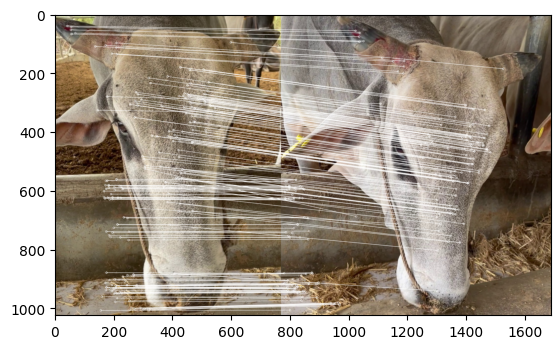

0.010417751849150954 0
0.020835503698301908 1
0.0338810774182619 2
0.1799640071985603 3
0.020238818053025704 3
0.0 3
0.020835503698301908 3
20.48911422606621 7
0.03275466754012447 7
0.03125325554745286 7
0.0 7
0.033211557622052475 7
0.11252813203300824 7
0.05305039787798408 7
0.03163555836760519 7
0.03078817733990148 7
0.08123476848090982 7
0.05208875924575477 7
0.02284148012791229 7
0.0 7
0.0 7
0.039393342525113256 7
0.032061558191728116 7
0.07846214201647705 7
0.0 7
0.018318373328448434 7
0.0 7
0.0 7
0.0 7
0.02262443438914027 7
0.14461315979754158 7
0.010417751849150954 7
0.02983293556085919 7
0.24752475247524752 7
0.035211267605633804 7
0.022784233310549098 7
0.0 7
0.0 7
0.03125325554745286 7
0.0423908435777872 7
0.06517842594101353 7
0.08066684592632428 7
0.0 7
0.12886597938144329 7
0.061031431187061336 7
0.02880184331797235 7
0.029112081513828242 7
0.015659254619480114 7
0.04381161007667032 7
0.03405994550408719 7
0.027770063871146906 7
0.0 7
0.0 7
0.058105752469494475 7
0.0122055

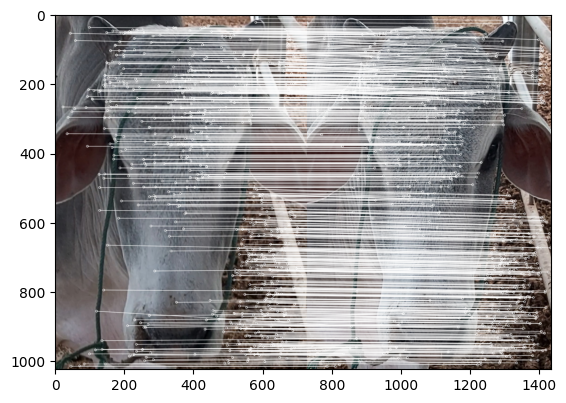

0.014611338398597311 0
0.0 0
0.01694053870913095 2
0.11997600479904018 3
0.020238818053025704 3
0.07084661707403471 3
0.043834015195791935 3
0.029824038174768867 3
0.0 3
0.014611338398597311 3
0.028169014084507043 3
0.09963467286615742 3
0.037509377344336084 3
0.05305039787798408 3
0.06327111673521038 3
0.06157635467980296 3
0.12185215272136475 16
0.014611338398597311 16
0.014611338398597311 16
0.0 16
0.08507018290089324 16
0.039393342525113256 16
0.06412311638345623 16
0.03923107100823853 16
0.02452783909737552 16
0.0 16
0.029222676797194622 16
0.014611338398597311 16
0.029222676797194622 16
0.02262443438914027 16
0.07230657989877079 16
0.014611338398597311 16
0.05966587112171838 16
0.24752475247524752 33
0.035211267605633804 33
0.045568466621098196 33
0.0 33
0.2770083102493075 37
0.029222676797194622 37
0.0423908435777872 37
0.016294606485253382 37
0.026888948642108095 37
0.03278688524590164 37
0.0 37
0.030515715593530668 37
0.02880184331797235 37
0.1455604075691412 37
0.031318509238

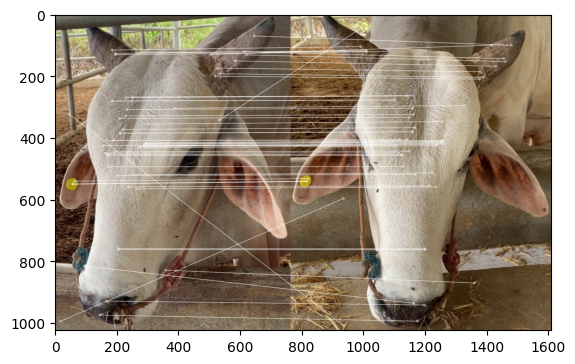

0.05901445854234287 0
0.029507229271171435 0
0.05901445854234287 0
0.0 0
0.0 0
0.08852168781351431 5
0.0 5
0.029824038174768867 5
0.0 5
0.029507229271171435 5
0.029507229271171435 5
0.16605778811026237 11
0.07501875468867217 11
0.029507229271171435 11
0.03163555836760519 11
0.03078817733990148 11
0.12185215272136475 11
0.11802891708468574 11
0.029507229271171435 11
0.0 11
0.0 11
0.14753614635585718 11
0.0 11
0.05901445854234287 11
0.0 11
0.05901445854234287 11
0.05901445854234287 11
0.08852168781351431 11
0.029507229271171435 11
0.05901445854234287 11
0.07230657989877079 11
0.029507229271171435 11
0.02983293556085919 11
0.49504950495049505 33
0.11802891708468574 33
0.05901445854234287 33
0.21321961620469082 33
0.2770083102493075 33
0.0 33
0.029507229271171435 33
0.08852168781351431 33
0.029507229271171435 33
0.0 33
0.0 33
0.091547146780592 33
0.0 33
0.08852168781351431 33
0.05901445854234287 33
0.0 33
0.05901445854234287 33
0.08852168781351431 33
0.05901445854234287 33
0.05901445854234

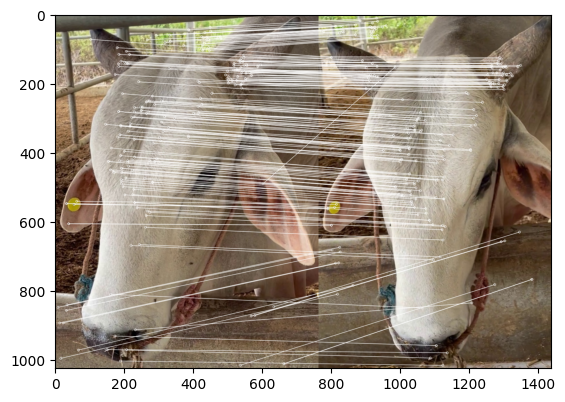

0.0 0
0.07841087297438579 1
0.026136957658128592 1
0.05998800239952009 1
0.0 1
0.052273915316257184 1
0.052273915316257184 1
0.0 1
0.026136957658128592 1
0.0 1
0.0 1
0.033211557622052475 1
0.0 1
0.026136957658128592 1
0.03163555836760519 1
0.0 1
0.0 1
0.0 1
0.052273915316257184 1
0.3246753246753247 19
0.04253509145044662 19
0.026136957658128592 19
0.06412311638345623 19
0.0 19
0.0 19
0.026136957658128592 19
0.052273915316257184 19
0.0 19
0.0 19
0.026136957658128592 19
0.0 19
0.052273915316257184 19
0.02983293556085919 19
0.24752475247524752 19
0.052273915316257184 19
0.026136957658128592 19
0.10660980810234541 19
0.0 19
0.10454783063251437 19
0.052273915316257184 19
0.026136957658128592 19
0.026888948642108095 19
0.03278688524590164 19
0.0 19
0.0 19
0.0576036866359447 19
0.0 19
0.0 19
0.0 19
0.07841087297438579 19
0.026136957658128592 19
0.10454783063251437 19
0.0 19
0.0 19
0.052273915316257184 19
0.0 19
0.03418803418803419 19
0.0 19
0.05468963631391851 19
0.0 19
0.0 19
0.0261369576581

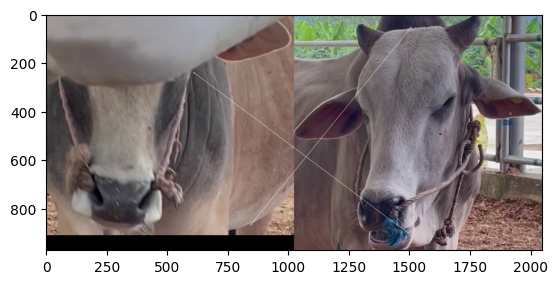

5.678657074340528 0
0.00907605736068252 0
0.01694053870913095 0
0.11997600479904018 0
0.0 0
0.053134962805526036 0
0.0292597288598459 0
0.0 0
0.03275466754012447 0
0.016012810248198558 0
0.028169014084507043 0
0.0 0
0.037509377344336084 0
0.0 0
0.0 0
0.06157635467980296 0
0.08123476848090982 0
0.0 0
0.0 0
0.0 0
0.04253509145044662 0
0.0 0
0.0 0
0.03923107100823853 0
0.0 0
0.03663674665689687 0
0.0 0
0.020927069163963585 0
0.0 0
0.0 0
0.14461315979754158 0
0.008362602441879913 0
0.02983293556085919 0
0.0 0
0.035211267605633804 0
0.045568466621098196 0
0.053304904051172705 0
0.0 0
0.025764342150463755 0
0.0423908435777872 0
0.0 0
0.026888948642108095 0
0.0 0
0.0 0
0.061031431187061336 0
0.02880184331797235 0
0.029112081513828242 0
0.07829627309740056 0
0.04381161007667032 0
0.011353315168029064 0
0.0 0
0.0 0
0.06116207951070336 0
0.0 0
0.012205541315757355 0
0.026304252520824196 0
0.03418803418803419 0
0.03756574004507889 0
0.08203445447087777 0
0.0 0
0.08340283569641367 0
0.054784514243

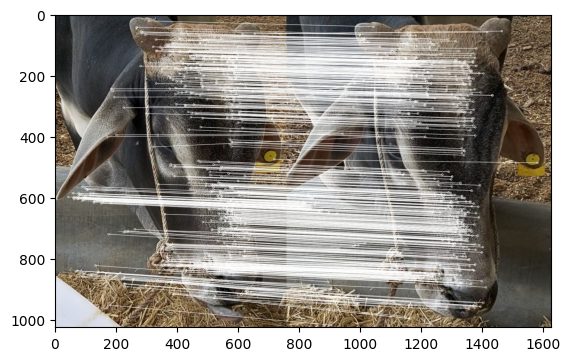

0.0 0
0.030553009471432937 1
0.09165902841429881 2
0.23995200959808036 3
0.030553009471432937 3
0.0 3
0.061106018942865874 3
0.0 3
0.12221203788573175 3
0.09165902841429881 3
0.030553009471432937 3
0.033211557622052475 3
0.07501875468867217 3
0.061106018942865874 3
0.06327111673521038 3
0.03078817733990148 3
0.12185215272136475 3
0.18331805682859761 3
0.061106018942865874 3
0.3246753246753247 19
0.04253509145044662 19
0.030553009471432937 19
0.0 19
0.0 19
0.030553009471432937 19
0.12221203788573175 19
0.030553009471432937 19
0.09165902841429881 19
0.0 19
0.030553009471432937 19
0.0 19
0.0 19
0.061106018942865874 19
0.49504950495049505 33
0.09165902841429881 33
0.030553009471432937 33
0.053304904051172705 33
0.2770083102493075 33
0.030553009471432937 33
0.09165902841429881 33
0.061106018942865874 33
0.0 33
0.0 33
0.12886597938144329 33
0.0 33
0.030553009471432937 33
0.061106018942865874 33
0.0 33
0.030553009471432937 33
0.15276504735716467 33
0.030553009471432937 33
0.12221203788573175 

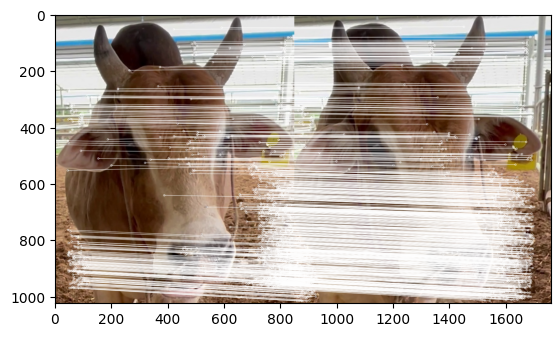

In [ ]:
# 测试 50 张 图片
for i in range(0,50):
  index = 0
  print("The max Score is :" + str(getMaxScore(i)))
  print("-----------------------------------------------------------")
  calculateResultsFor(index,i)

In [ ]:
rm -f ./data/test/*

In [ ]:
# for i in range(0,50):
index = 0
print("The max Score is :" + str(getMaxScore(0)))
print("-----------------------------------------------------------")
calculateResultsFor(index,0)

In [ ]:
for i in range(0,10):
    calculateResultsFor(i,10)

In [ ]:
for i in range(0,10):
    calculateResultsFor(i,2)

In [ ]:
for i in range(0,10):
    calculateResultsFor(i,11)

In [ ]:
for i in range(0,10):
    calculateResultsFor(i,12)